# Exploratory Data Analysis - demo

## Import Libraries

In [5]:
### Import Libraries

import os
import pickle
import warnings
from wordcloud import WordCloud
from sklearn.feature_extraction.text import CountVectorizer
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

plt.style.use("bmh")
warnings.filterwarnings("ignore")

### set directory
Im_dir_path = "/home/zhendi/pm/scripts/image/EDA/"

### inport data
result = pd.read_pickle("/home/zhendi/pm/scripts/result_non_split_rmnum2.pkl")

### utils for saving and loading
def save_img(fig, path, name):
    file_path = os.path.join(path, name)
    fig.savefig(file_path)


def save_obj(obj, file_address):
    with open(file_address, "wb") as f:
        pickle.dump(obj, f, pickle.HIGHEST_PROTOCOL)


def load_obj(file_address):
    with open(file_address, "rb") as f:
        return pickle.load(f)


## Univariant Analysis for Gene and Variation

### Distribution of classes

Data have imbalanced number of classes. This makes the multi-class classification more difficult. Normal accuracy metric for performance evaluation is not reliable, instead, balanced accuracy in scikit learn will be used. And log loss seems to be very reliable in this project.

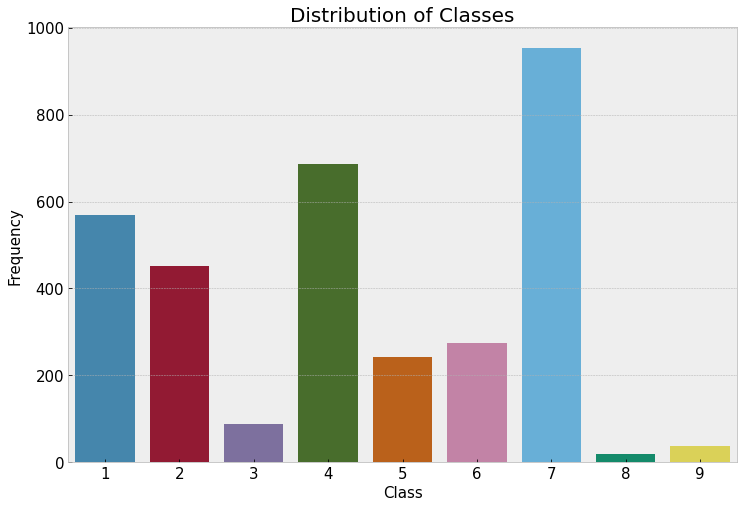

In [7]:

fig = plt.figure(figsize=(12, 8))
sns.countplot(x="Class", data=result)
plt.ylabel("Frequency", fontsize=15)
plt.xlabel("Class", fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title("Distribution of Classes", fontsize=20)
save_img(fig, Im_dir_path, "DistributionOfClasses.png")
plt.show()

### Distribution of genes

As shown in the figure, there are a lot of rare genes. This situation seems to make the Gene feature less useful.

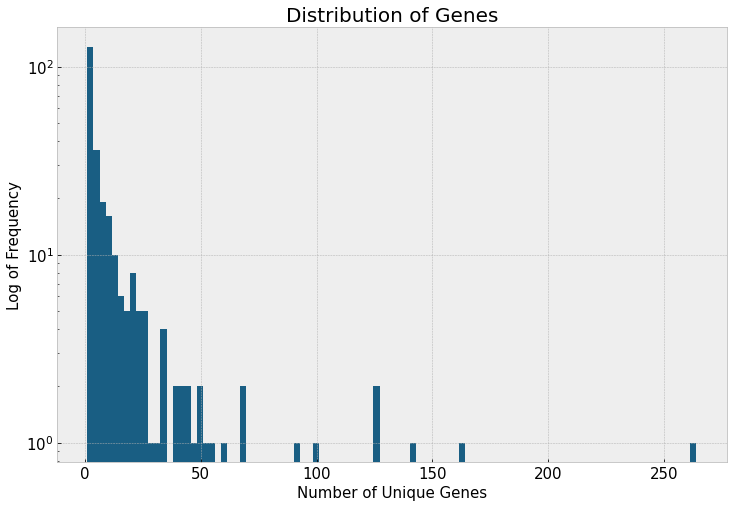

In [7]:
# Distribution of genes
Genes = result.groupby("Gene")["Gene"].count()
top_genes = Genes.sort_values(ascending=False)[:20]
fig = plt.figure(figsize=(12, 8))
plt.hist(Genes.values, bins=100, log=True, color="#195e83")
plt.xlabel("Number of Unique Genes", fontsize=15)
plt.ylabel("Log of Frequency", fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title("Distribution of Genes", fontsize=20)
save_img(fig, Im_dir_path, "DistributionOfGenes.png")
plt.show()

### Distribution of variations

Similar to Genes, there are a lot of variations that are rare. This situation is common in biology, which is why the task of classifying cancer types of gene mutations based on types of genes and mutation is regarded extremely hard.

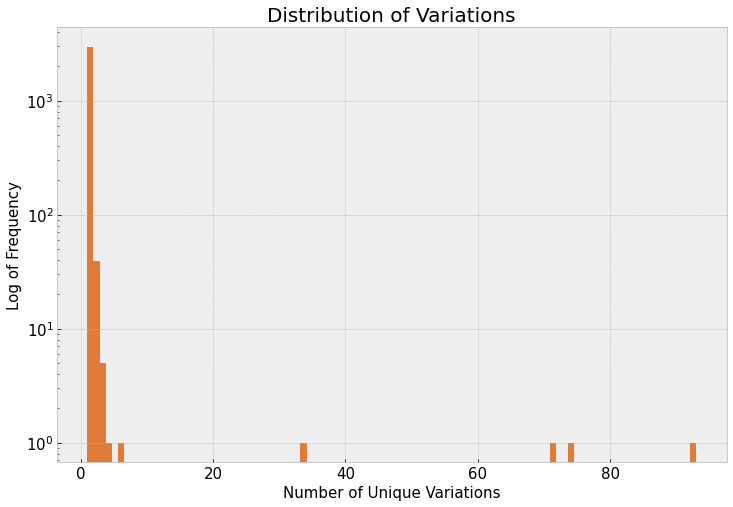

In [9]:
# Distribution of variations
Variation = result.groupby("Variation")["Variation"].count()
fig = plt.figure(figsize=(12, 8))
plt.hist(Variation.values, bins=100, log=True, color="#e07b39")
plt.xlabel("Number of Unique Variations", fontsize=15)
plt.ylabel("Log of Frequency", fontsize=15)
plt.title("Distribution of Variations", fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
save_img(fig, Im_dir_path, "DistributionOfVariations.png")
plt.show()


## Bivariant Analysis for Gene and Variation


### Interaction between Genes and Classes

In [11]:
# Interaction between Genes and Classes
gene_counted = (
    result.groupby(["Class", "Gene"])["Gene"].count().reset_index(name="count")
)
gene_sorted = pd.DataFrame()
for i in range(9):
    index = i + 1
    selected = gene_counted[gene_counted["Class"] == index]
    selected = selected.sort_values("count", ascending=False)[:8]
    print(selected)
    gene_sorted = pd.concat([gene_sorted, selected], axis=0)


     Class   Gene  count
136      1   TP53     83
19       1  BRCA1     60
139      1   TSC2     23
20       1  BRCA2     18
44       1  ERCC2     17
140      1    VHL     15
124      1  SMAD4     13
107      1  PTPRT     13
     Class    Gene  count
164      2    EGFR     45
191      2     KIT     44
153      2    BRAF     31
142      2    ABL1     24
227      2    ROS1     18
184      2    HRAS     15
218      2  PIK3CA     14
167      2   ERBB2     14
     Class    Gene  count
241      3   BRCA1     15
253      3    MTOR     11
239      3     ALK     10
255      3  PDGFRA      9
249      3    FLT3      7
263      3    TSC1      6
257      3    PTEN      5
246      3   ERBB4      3
     Class    Gene  count
325      4    PTEN    115
352      4    TP53     67
280      4  CDKN2A     47
270      4   BRCA1     46
355      4     VHL     23
354      4    TSC2     23
334      4   RUNX1     16
275      4     CBL     16
     Class    Gene  count
361      5   BRCA1     90
362      5   BRCA2   

### Top 8 genes among 9 classes

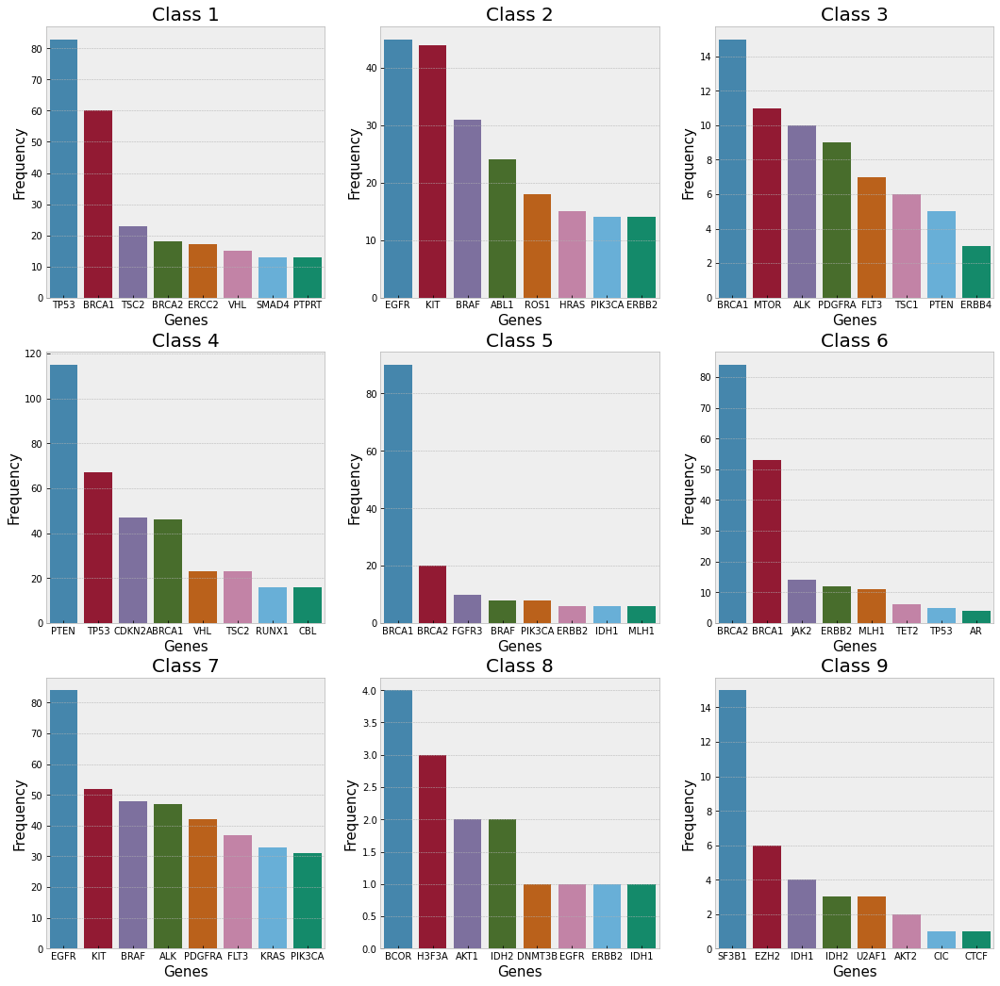

In [14]:
fig, ax = plt.subplots(ncols=3, nrows=3, figsize=(18, 18))
for i in range(3):
    for j in range(3):
        sns.barplot(
            x="Gene",
            y="count",
            data=gene_sorted[gene_sorted["Class"] == ((i * 3 + j) + 1)],
            ax=ax[i][j],
        )
        ax[i, j].set_title("Class %d" % ((i * 3 + j) + 1), fontsize=20)
        ax[i, j].set_xlabel("Genes", fontsize=15)
        ax[i, j].set_ylabel("Frequency", fontsize=15)
        ax[i, j].yaxis.set_tick_params(labelsize="medium")
        ax[i, j].xaxis.set_tick_params(labelsize="medium")
save_img(fig, Im_dir_path, "Top8Genes9Classes.png")


## Univariant Analysis for Text data

### Distribution of words and characters

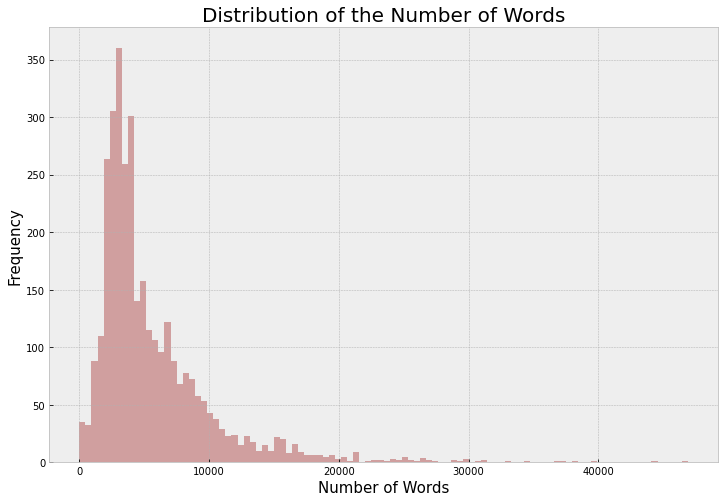

In [18]:
# Distribution of words 
n_words = result["TEXT"].apply(lambda x: len(str(x).split()))
fig = plt.figure(figsize=(12, 8))
sns.distplot(n_words.values, bins=100, kde=False, color="brown")
plt.xlabel("Number of Words", fontsize=15)
plt.ylabel("Frequency", fontsize=15)
plt.title("Distribution of the Number of Words", fontsize=20)
save_img(fig, Im_dir_path, "DistributionOfWords.png")
plt.show()

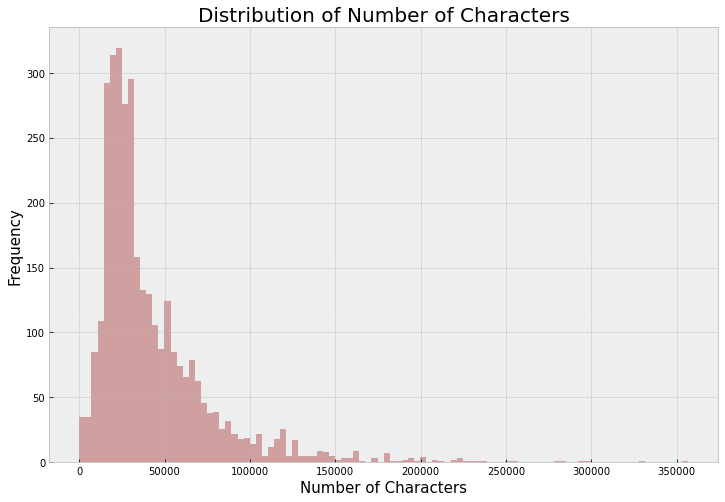

In [17]:
# Distribution of characters
n_chars = result["TEXT"].apply(lambda x: len(str(x)))
fig = plt.figure(figsize=(12, 8))
sns.distplot(n_chars.values, bins=100, kde=False, color="brown")
plt.xlabel("Number of Characters", fontsize=15)
plt.ylabel("Frequency", fontsize=15)
plt.title("Distribution of Number of Characters", fontsize=20)
save_img(fig, Im_dir_path, "DistributionOfChars.png")
plt.show()

### Text length distribution

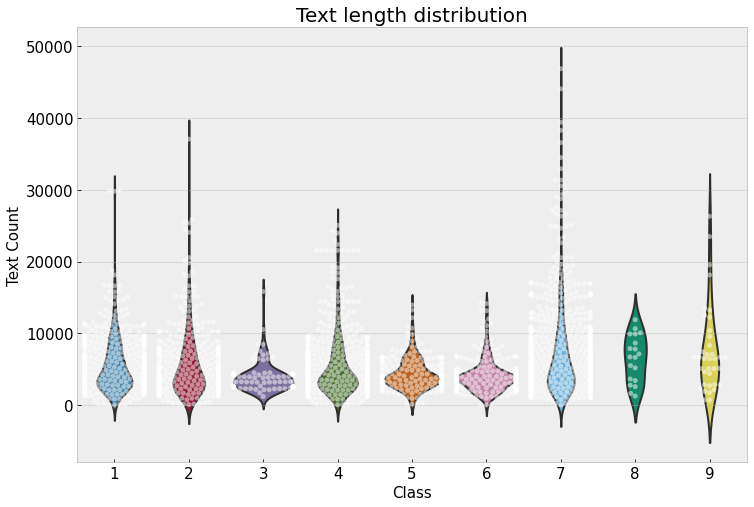

In [20]:
### Text length distribution
result['n_words'] = result["TEXT"].apply(lambda x: len(str(x).split()))
fig = plt.figure(figsize=(12, 8))
sns.violinplot(x="Class", y="n_words", data=result, inner=None)
sns.swarmplot(x="Class", y="n_words", data=result, color="w", alpha=0.5)
plt.ylabel("Text Count", fontsize=15)
plt.xlabel("Class", fontsize=15)
plt.title("Text length distribution", fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
save_img(fig, Im_dir_path, "TextLength9Classes.png")
plt.show()

### WordCloud for all text

word cloud for text 


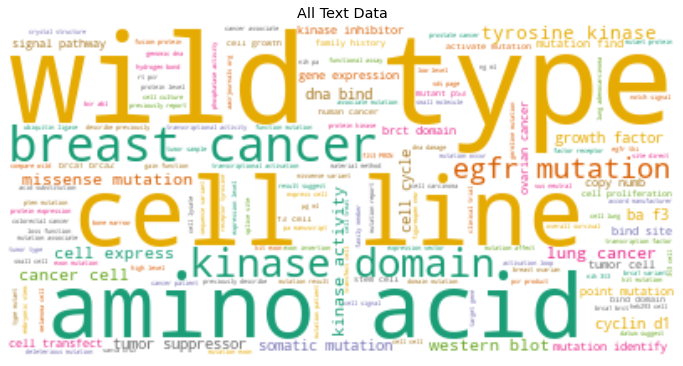

In [26]:
### Wordcloud for all the text


def plotWordCloud_forall():
    combText = result["TEXT"].agg(lambda x: " ".join(x.dropna()))
    wordcloud = WordCloud(
        background_color="white", colormap="Dark2", max_font_size=150, random_state=42
    ).generate(combText)
    # Display the generated image:
    print("word cloud for text ")
    fig = plt.figure(figsize=(12, 8))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.title("All Text Data")
    plt.axis("off")
    save_img(fig, Im_dir_path, "wordCloud_forall.png")
    plt.show()


plotWordCloud_forall()

In [27]:
### Wordcloud for each class

word cloud for Class:  1


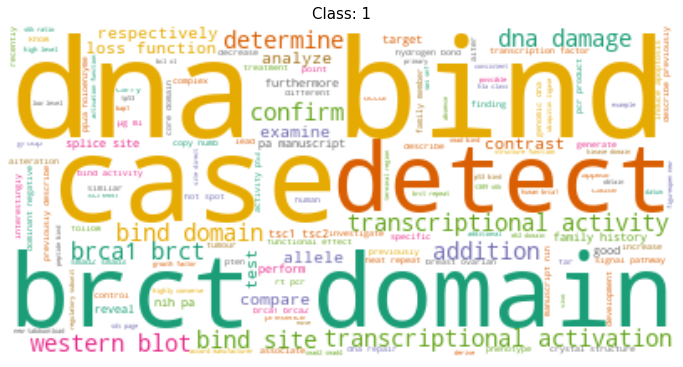

word cloud for Class:  2


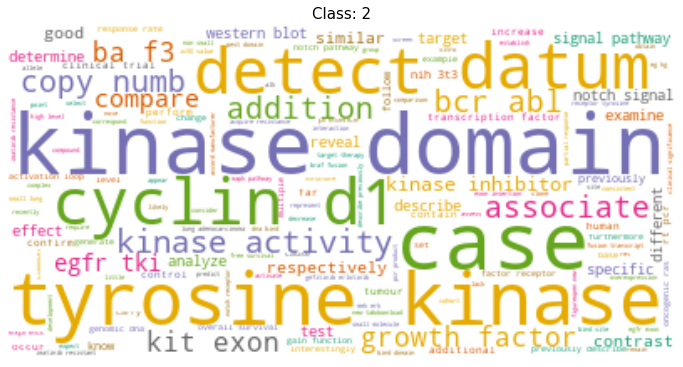

word cloud for Class:  3


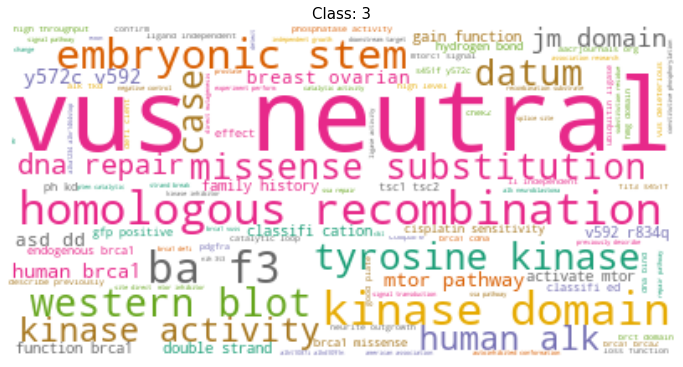

word cloud for Class:  4


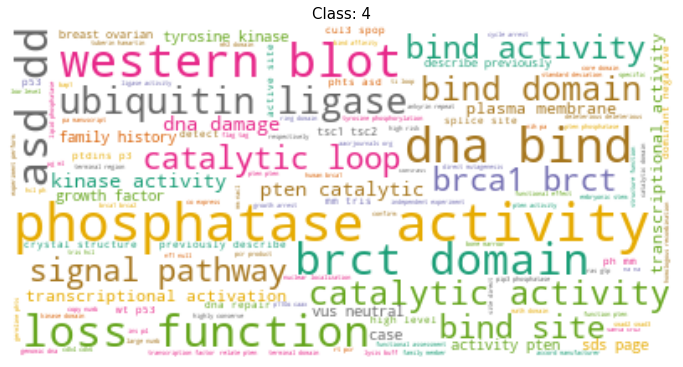

word cloud for Class:  5


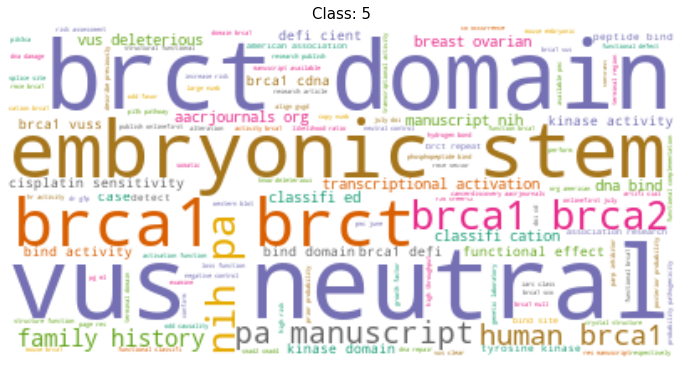

word cloud for Class:  6


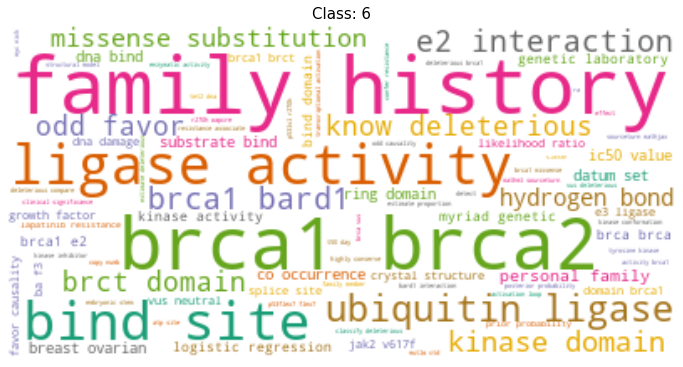

word cloud for Class:  7


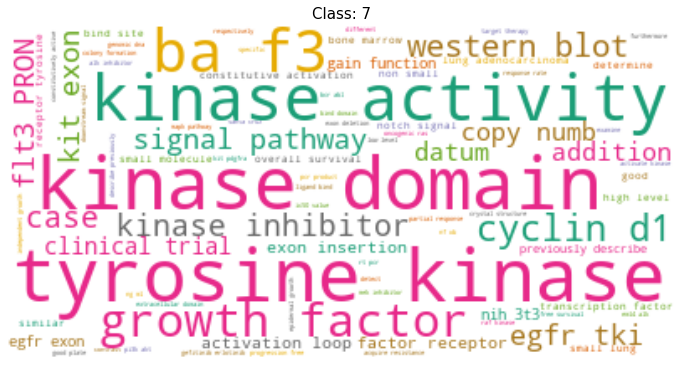

word cloud for Class:  8


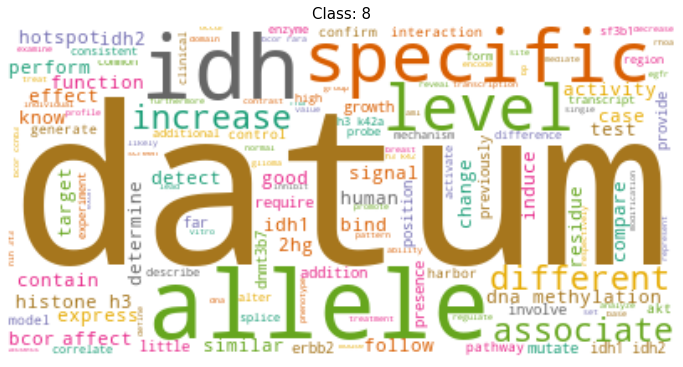

word cloud for Class:  9


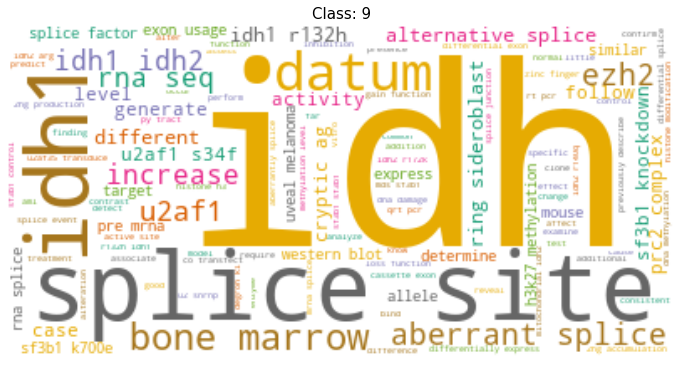

In [3]:
## Wordcloud for each class
result = pd.read_pickle("/home/zhendi/pm/scripts/result_non_split_strict.pkl")

wc = WordCloud(
    background_color="white", colormap="Dark2", max_font_size=150, random_state=42
)


def plotWordCloud_foreach(class_n, model, TEXTdata):
    combText = TEXTdata.agg(lambda x: " ".join(x.dropna()))
    wordcloud = model.generate(combText)
    # Display the generated image:
    print("word cloud for Class: ", class_n)
    fig = plt.figure(figsize=(12, 8))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.title("Class: " + str(class_n), fontsize=15)
    plt.axis("off")
    filename = "wordCloud_class_" + str(class_n) + ".png"
    save_img(fig, Im_dir_path, filename)
    plt.show()


for i in range(9):
    class_n = i + 1
    textdata = result[result["Class"] == class_n]["TEXT"]
    plotWordCloud_foreach(class_n, wc, textdata)


### Distribution of Unigram, Bigram, and Trigram

In [29]:
# build the model
vec = CountVectorizer().fit(result["TEXT"])

In [30]:
#### Non-strict for unigrams

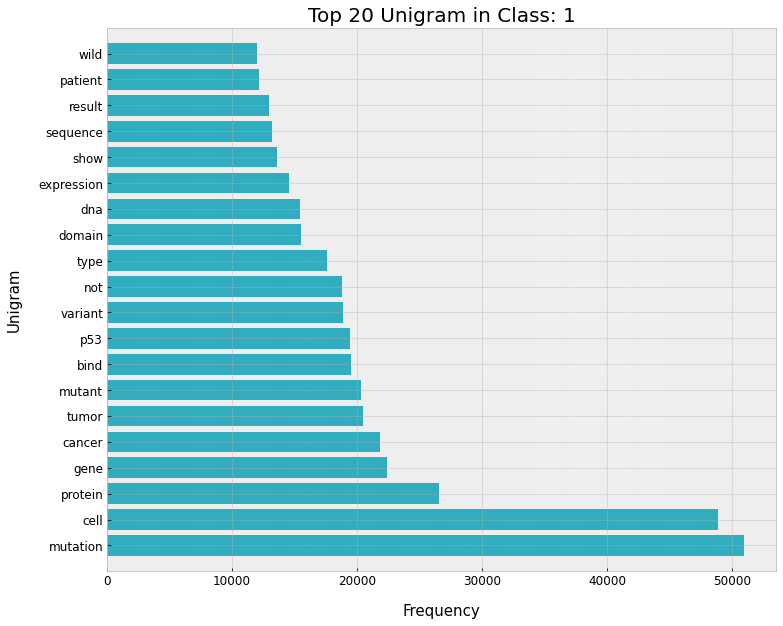

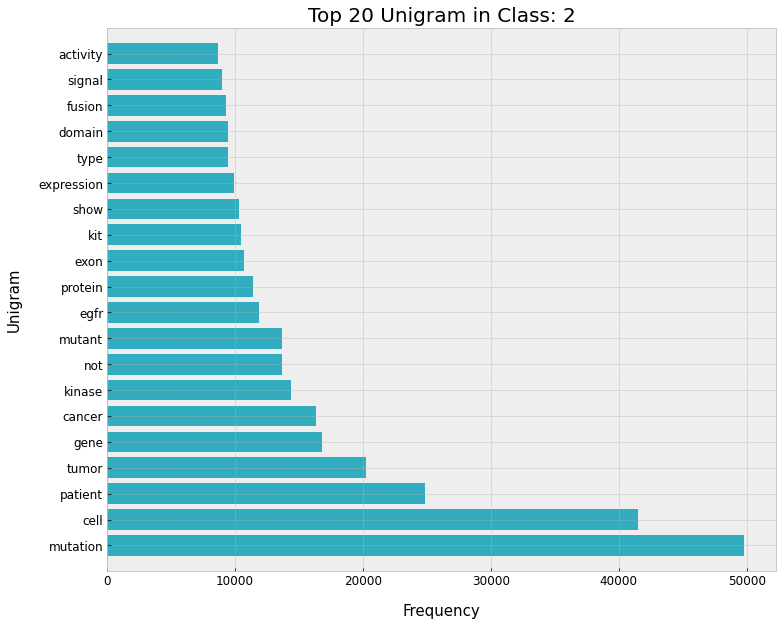

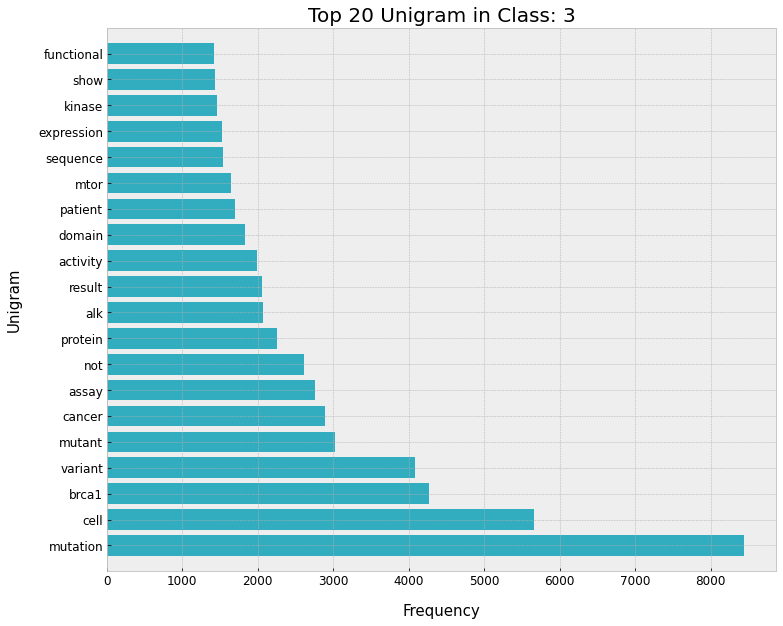

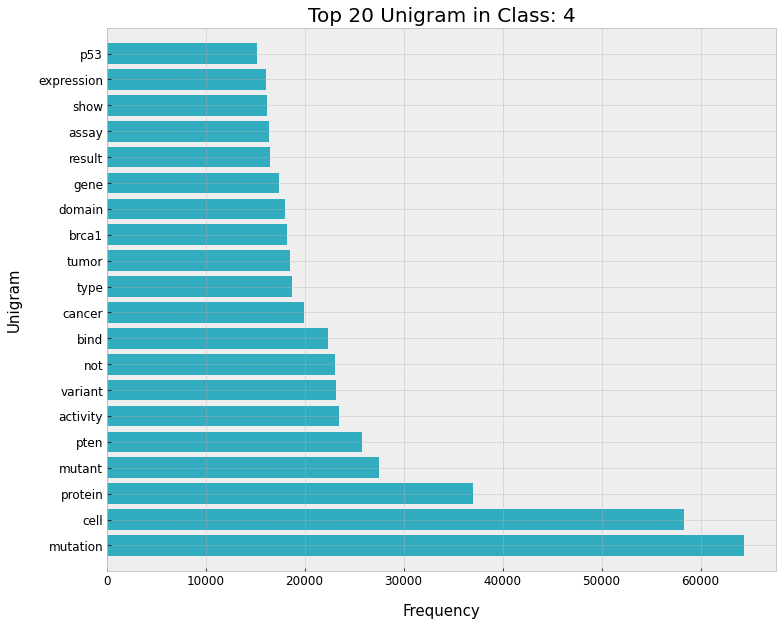

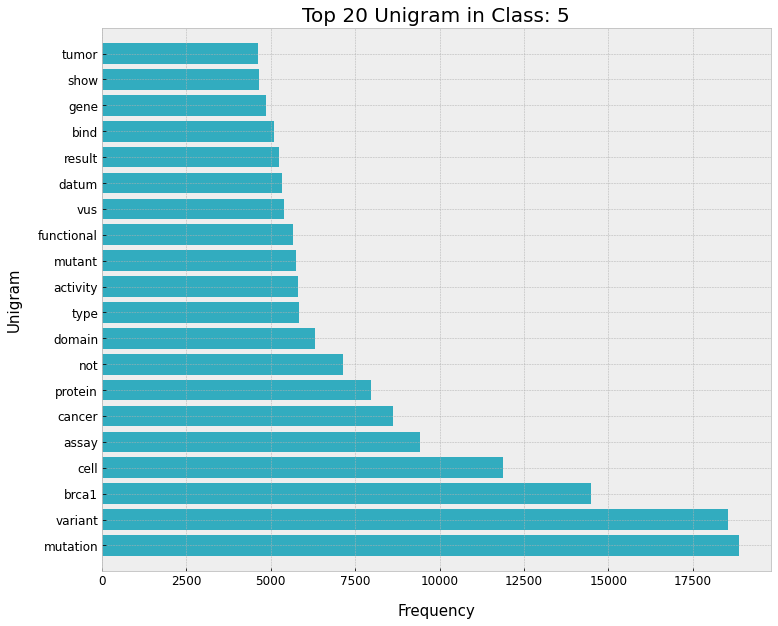

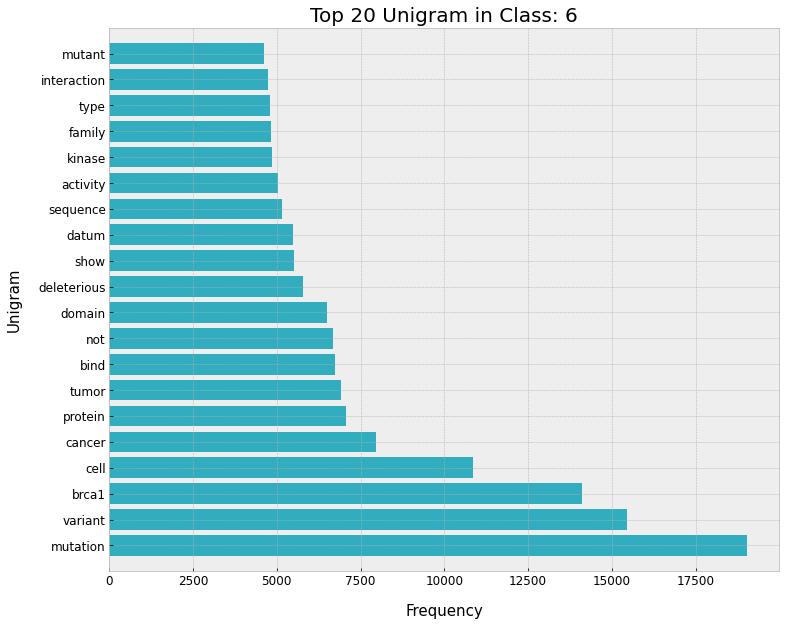

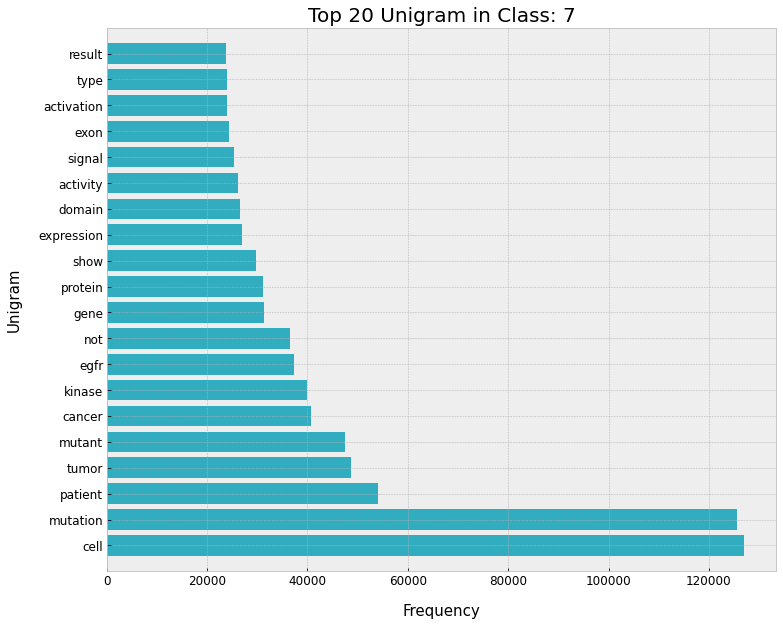

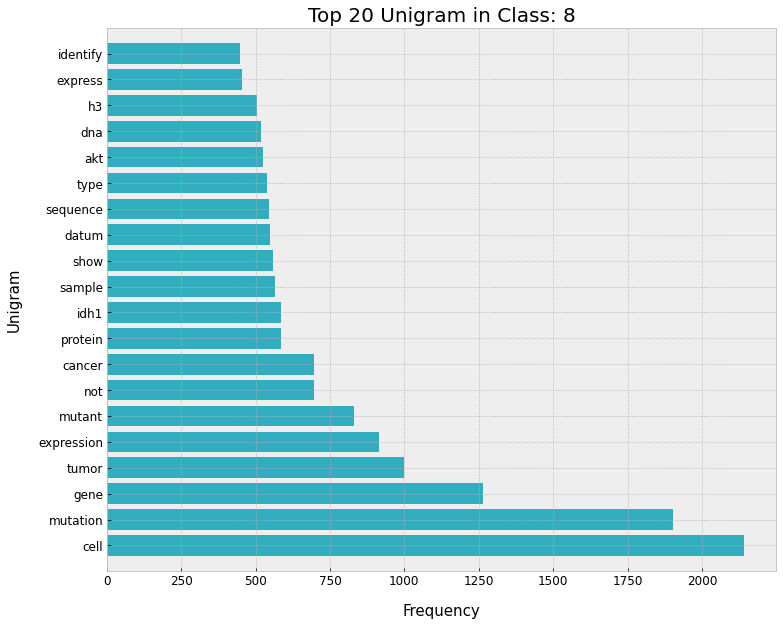

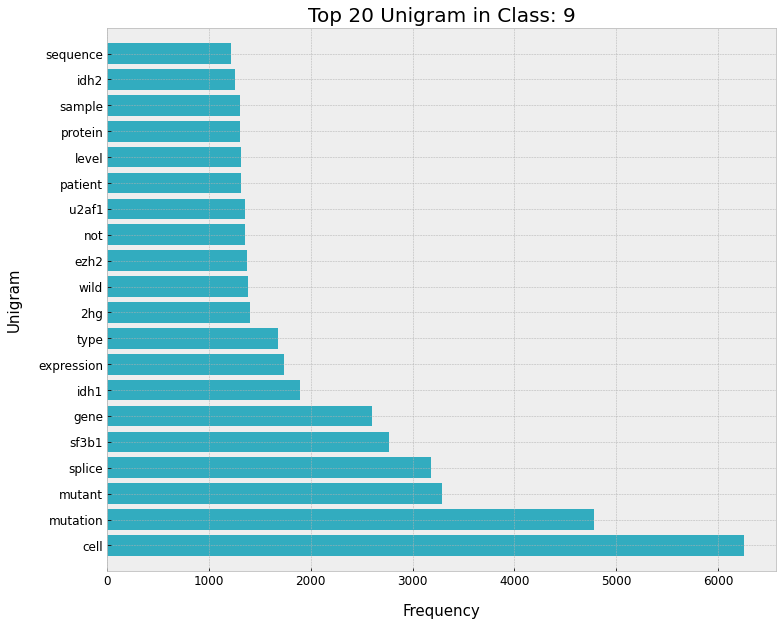

In [31]:
result = pd.read_pickle("/home/zhendi/pm/scripts/result_non_split_rmnum2.pkl")
vec = CountVectorizer(ngram_range=(1, 1)).fit(result["TEXT"])


def get_top_n_words(x, model, n):
    vec = model
    bow = vec.transform(x)
    sum_words = bow.sum(axis=0)
    vec.vocabulary_.items()  # give a dictionary
    words_freq = [
        (word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()
    ]  # a list
    words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)  # a sorted list
    return words_freq[:n]  # select numbers


dict_unigram = {}
for i in range(9):
    class_n = i + 1
    textdata = result[result["Class"] == class_n]["TEXT"]
    dict_unigram[class_n] = get_top_n_words(textdata, vec, 20)
df_list = [
    pd.DataFrame(dict_unigram[i + 1], columns=["Unigram", "Frequency"])
    for i in range(9)
]


def plot_classfeats_h(dfs):
    x = np.arange(len(dfs[0]))  # y axis ticks
    for i, df in enumerate(dfs):
        fig = plt.figure(figsize=(12, 10))
        plt.xlabel("Frequency", labelpad=16, fontsize=15)
        plt.ylabel("Unigram", labelpad=16, fontsize=15)
        plt.title("Top 20 Unigram in Class: " + str(i + 1), fontsize=20)
        plt.barh(df.Unigram, df.Frequency, align="center", color="#32acbf")
        plt.yticks(x, fontsize=12)
        plt.xticks(fontsize=12)
        plt.ylim([-1, x[-1] + 1])
        save_img(fig, Im_dir_path, "TextFeature_Count_uni_Class" + str(i + 1) + ".png")
        plt.show()


plot_classfeats_h(df_list)

### Non-strict for bigrams

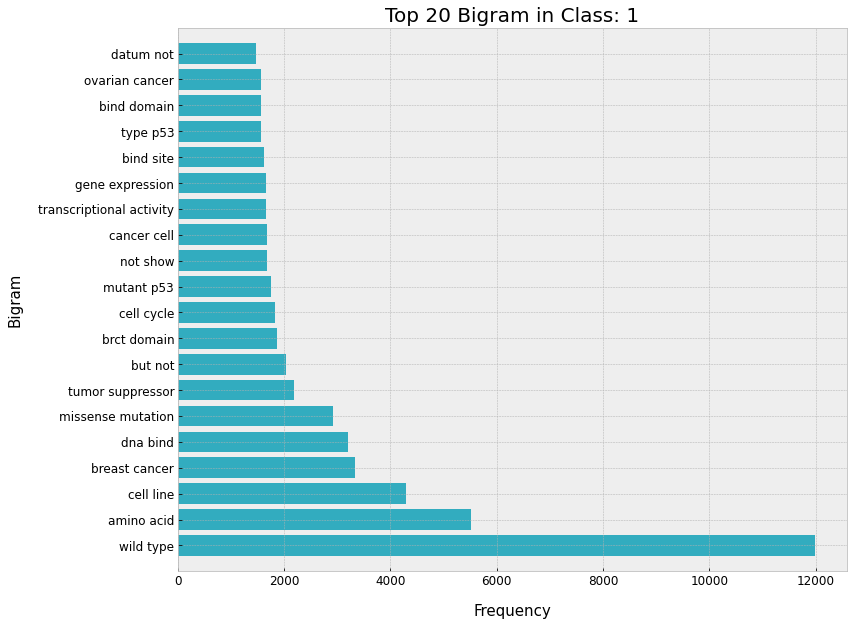

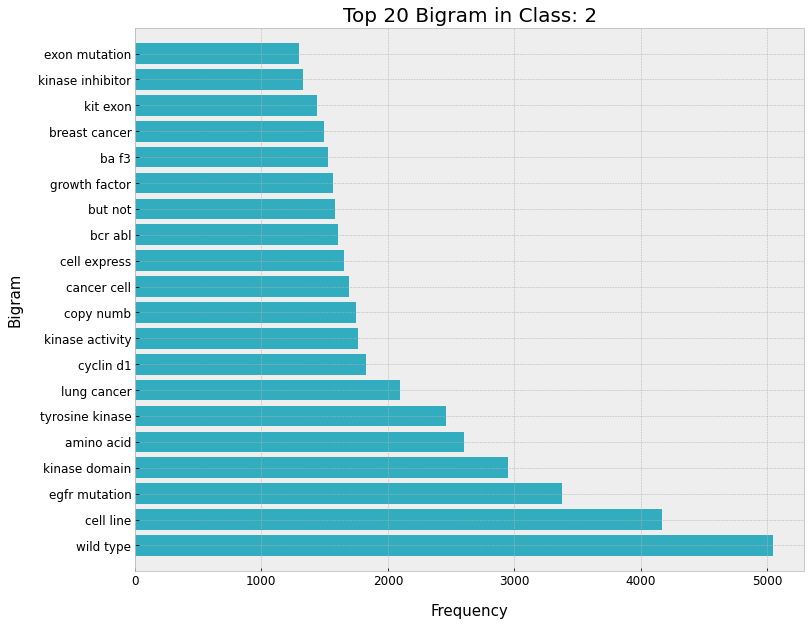

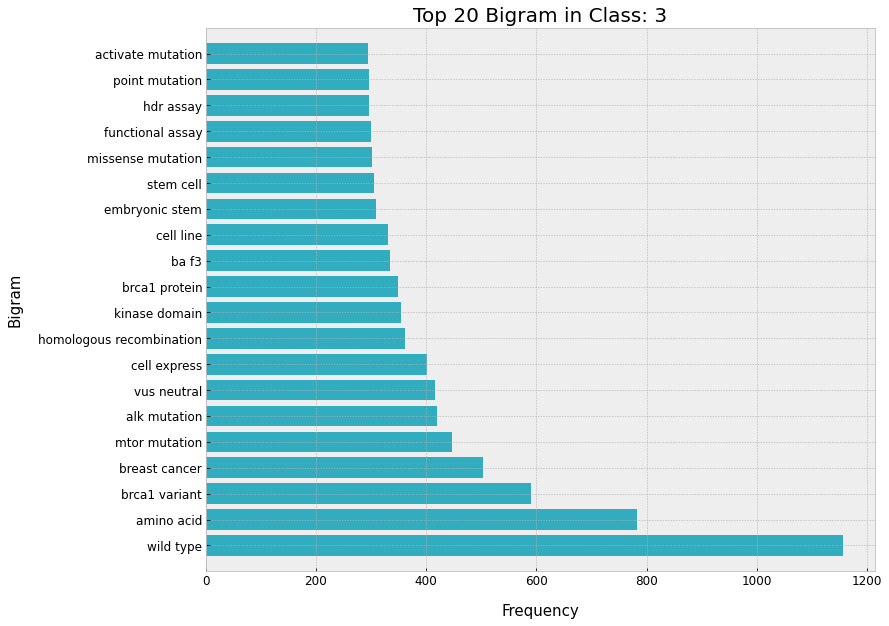

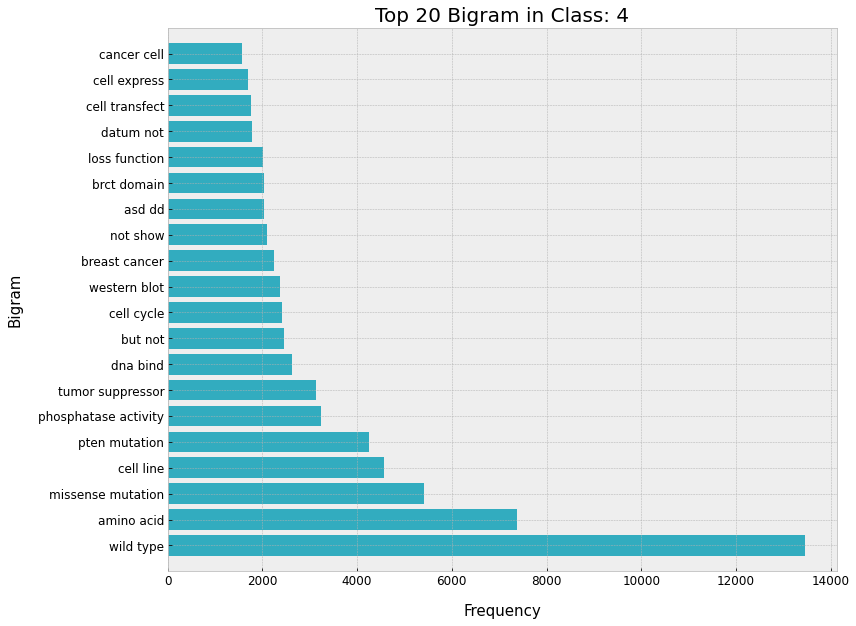

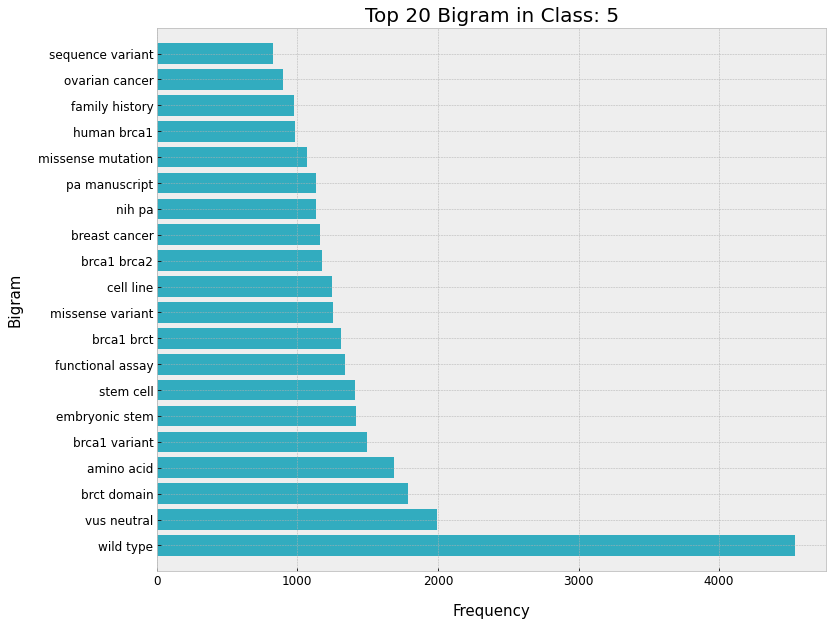

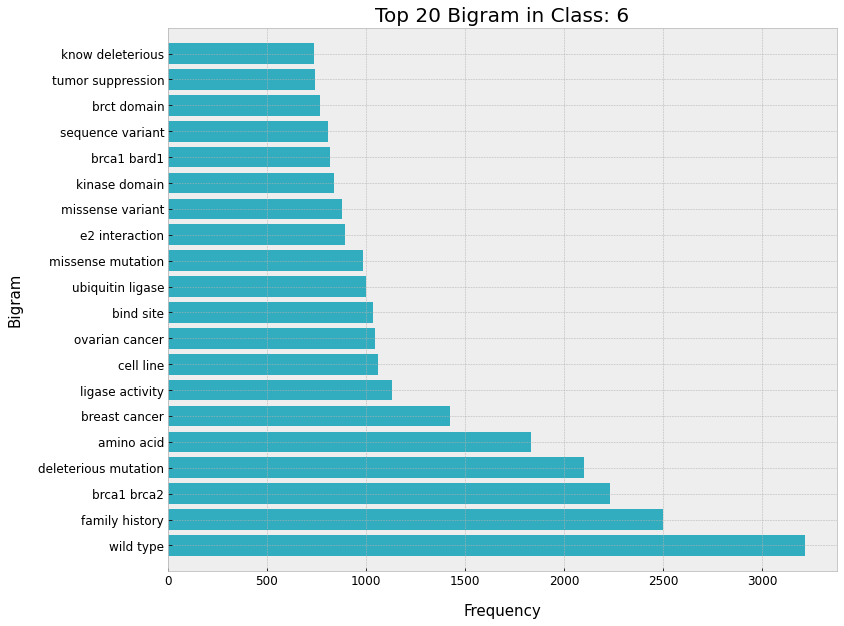

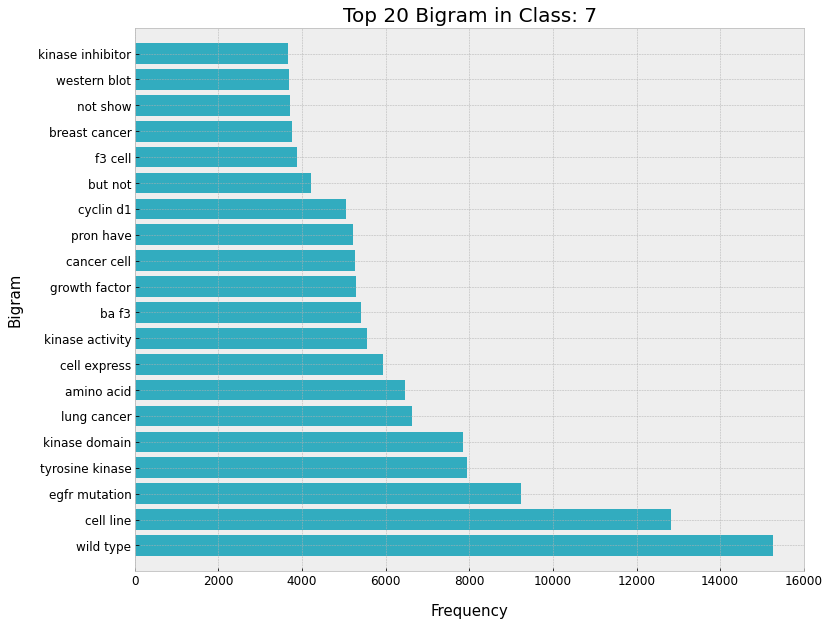

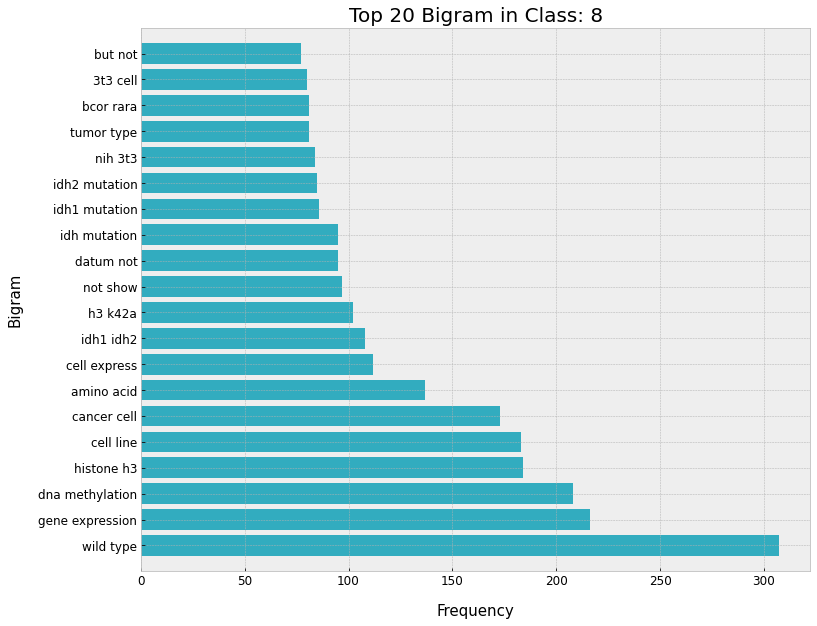

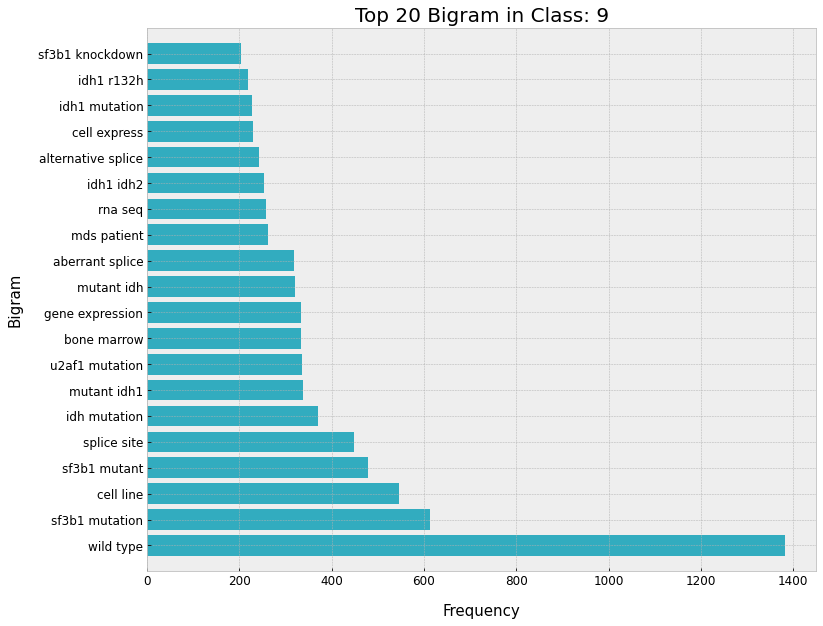

In [2]:
result = pd.read_pickle("/home/zhendi/pm/scripts/result_non_split_rmnum2.pkl")
vec = CountVectorizer(ngram_range=(2, 2)).fit(result["TEXT"])


def get_top_n_words(x, model, n):
    vec = model
    bow = vec.transform(x)
    sum_words = bow.sum(axis=0)
    vec.vocabulary_.items()  # give a dictionary
    words_freq = [
        (word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()
    ]  # a list
    words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)  # a sorted list
    return words_freq[:n]  # select numbers


dict_unigram = {}
for i in range(9):
    class_n = i + 1
    textdata = result[result["Class"] == class_n]["TEXT"]
    dict_unigram[class_n] = get_top_n_words(textdata, vec, 20)

df_list = [
    pd.DataFrame(dict_unigram[i + 1], columns=["Bigram", "Frequency"]) for i in range(9)
]


def plot_classfeats_h(dfs):
    x = np.arange(len(dfs[0]))  # y axis ticks
    for i, df in enumerate(dfs):
        fig = plt.figure(figsize=(12, 10))
        plt.xlabel("Frequency", labelpad=16, fontsize=15)
        plt.ylabel("Bigram", labelpad=16, fontsize=15)
        plt.title("Top 20 Bigram in Class: " + str(i + 1), fontsize=20)
        plt.barh(df.Bigram, df.Frequency, align="center", color="#32acbf")
        plt.yticks(x, fontsize=12)
        plt.xticks(fontsize=12)
        plt.ylim([-1, x[-1] + 1])
        save_img(fig, Im_dir_path, "TextFeature_Count_bi_Class" + str(i + 1) + ".png")
        plt.show()


plot_classfeats_h(df_list)

#### non-strict for trigrams

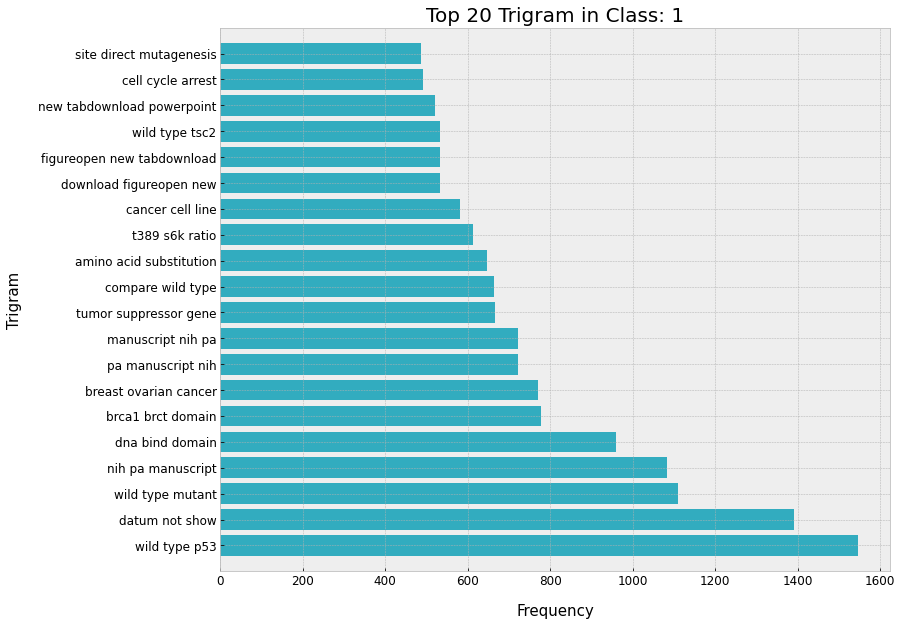

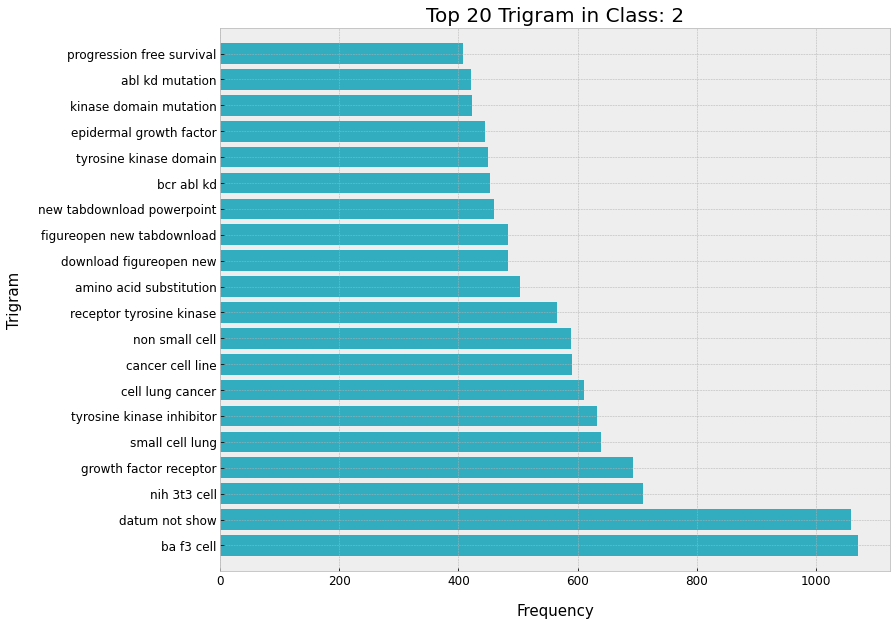

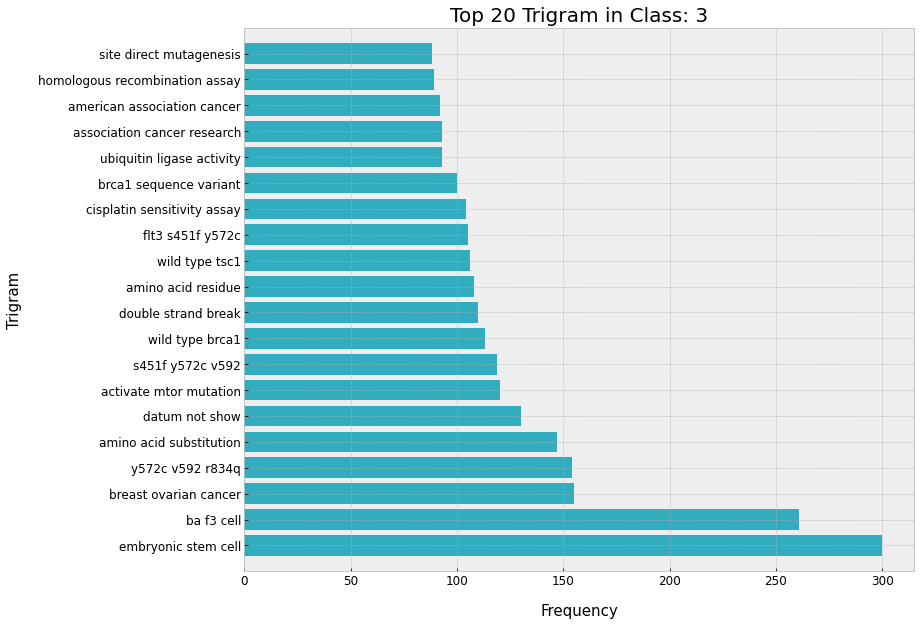

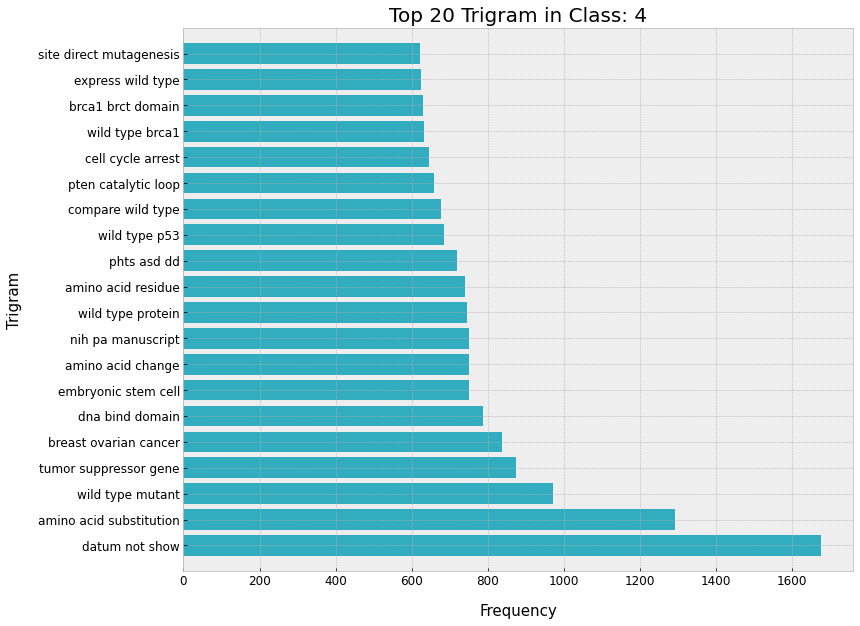

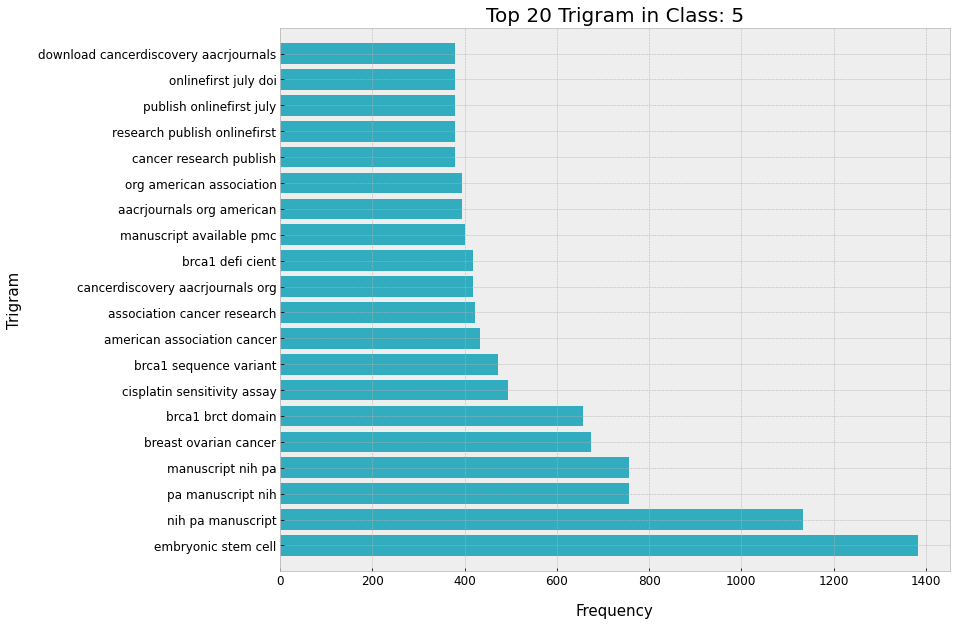

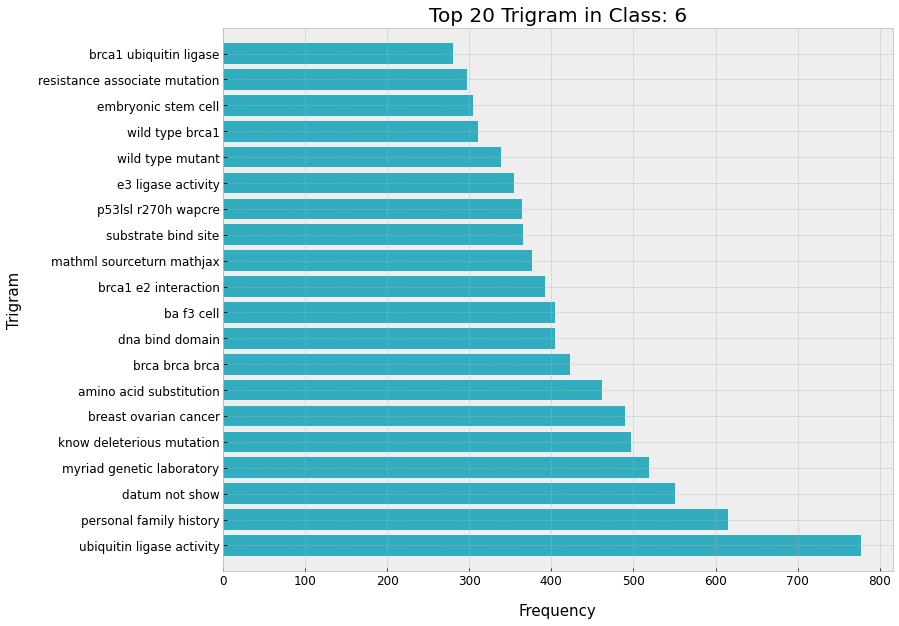

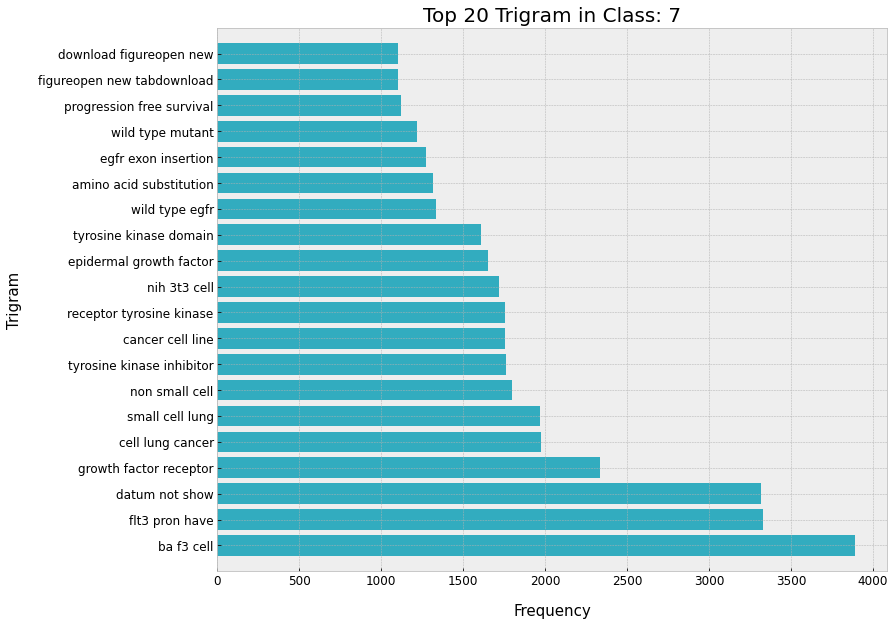

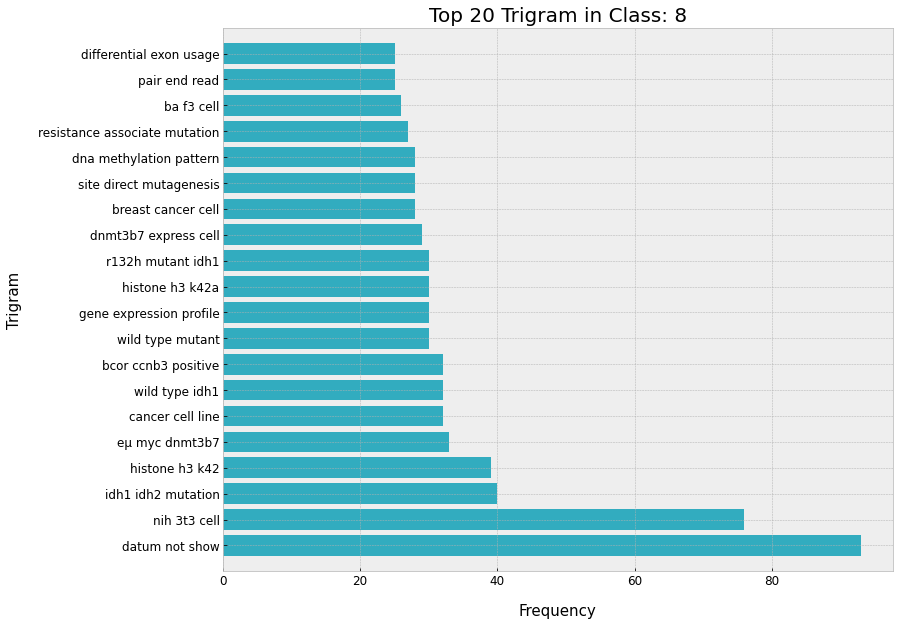

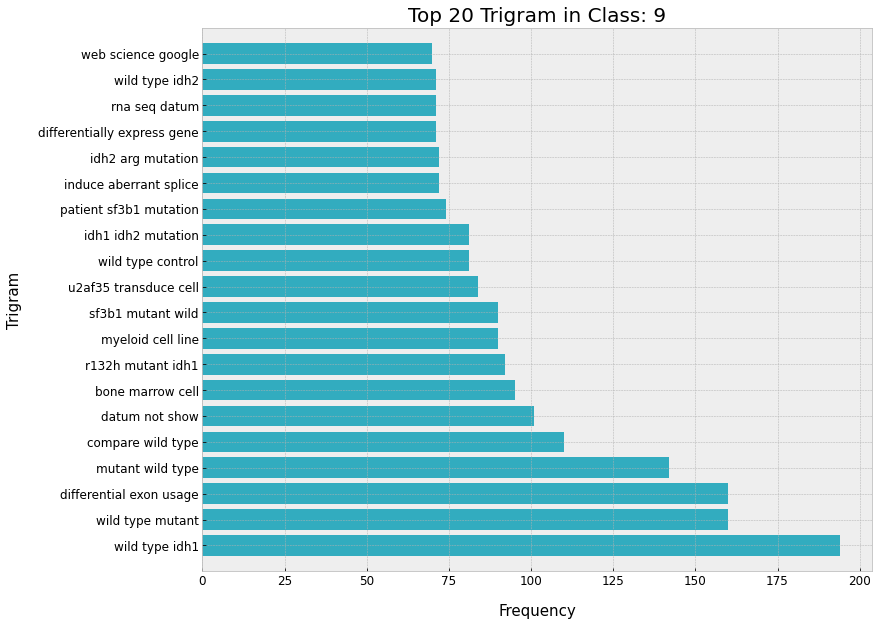

In [3]:
result = pd.read_pickle("/home/zhendi/pm/scripts/result_non_split_rmnum2.pkl")
vec = CountVectorizer(ngram_range=(3, 3)).fit(result["TEXT"])


def get_top_n_words(x, model, n):
    vec = model
    bow = vec.transform(x)
    sum_words = bow.sum(axis=0)
    vec.vocabulary_.items()  # give a dictionary
    words_freq = [
        (word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()
    ]  # a list
    words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)  # a sorted list
    return words_freq[:n]  # select numbers


dict_unigram = {}
for i in range(9):
    class_n = i + 1
    textdata = result[result["Class"] == class_n]["TEXT"]
    dict_unigram[class_n] = get_top_n_words(textdata, vec, 20)

df_list = [
    pd.DataFrame(dict_unigram[i + 1], columns=["Trigram", "Frequency"])
    for i in range(9)
]


def plot_classfeats_h(dfs):
    x = np.arange(len(dfs[0]))  # y axis ticks
    for i, df in enumerate(dfs):
        fig = plt.figure(figsize=(12, 10))
        plt.xlabel("Frequency", labelpad=16, fontsize=15)
        plt.ylabel("Trigram", labelpad=16, fontsize=15)
        plt.title("Top 20 Trigram in Class: " + str(i + 1), fontsize=20)
        plt.barh(df.Trigram, df.Frequency, align="center", color="#32acbf")
        plt.yticks(x, fontsize=12)
        plt.xticks(fontsize=12)
        plt.ylim([-1, x[-1] + 1])
        save_img(fig, Im_dir_path, "TextFeature_Count_tri_Class" + str(i + 1) + ".png")
        plt.show()


plot_classfeats_h(df_list)


#### Strict for unigrams

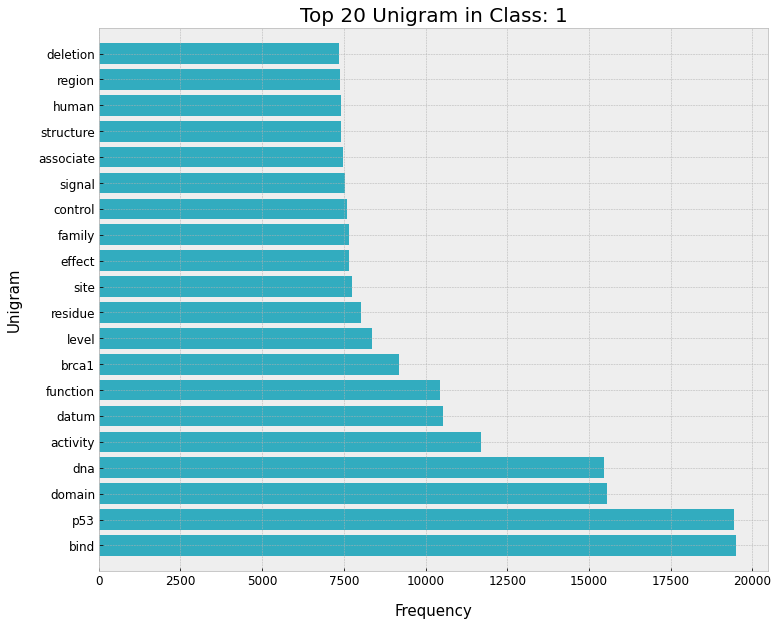

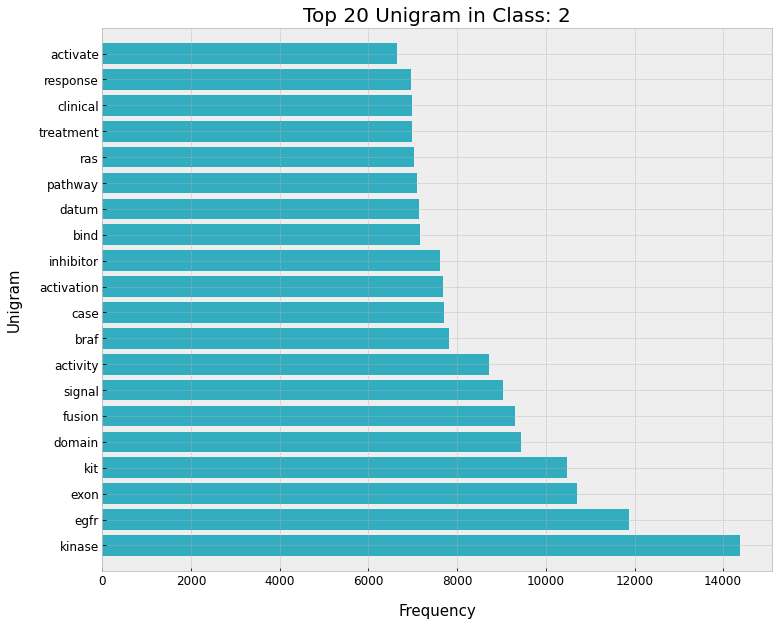

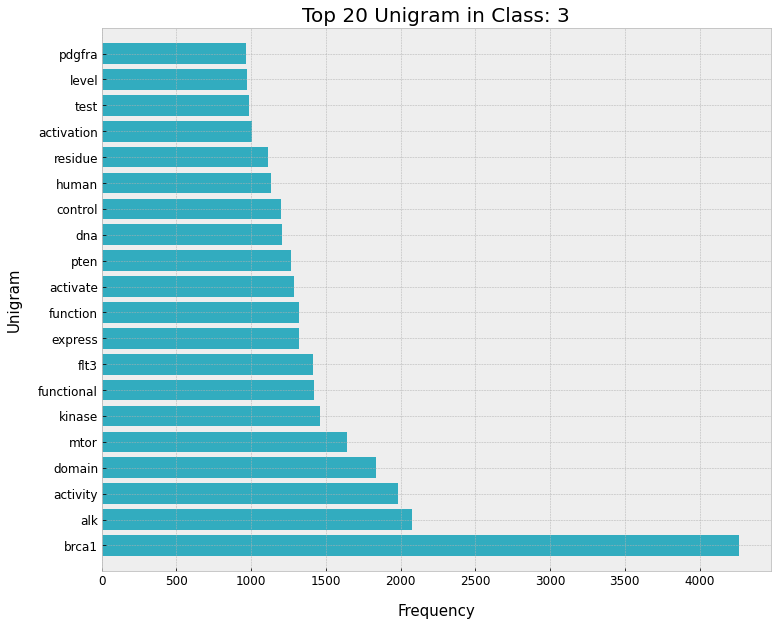

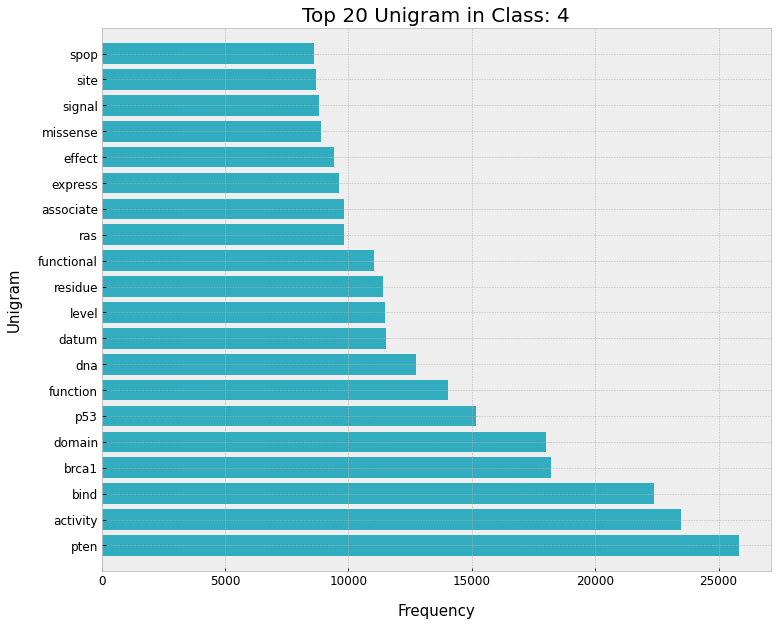

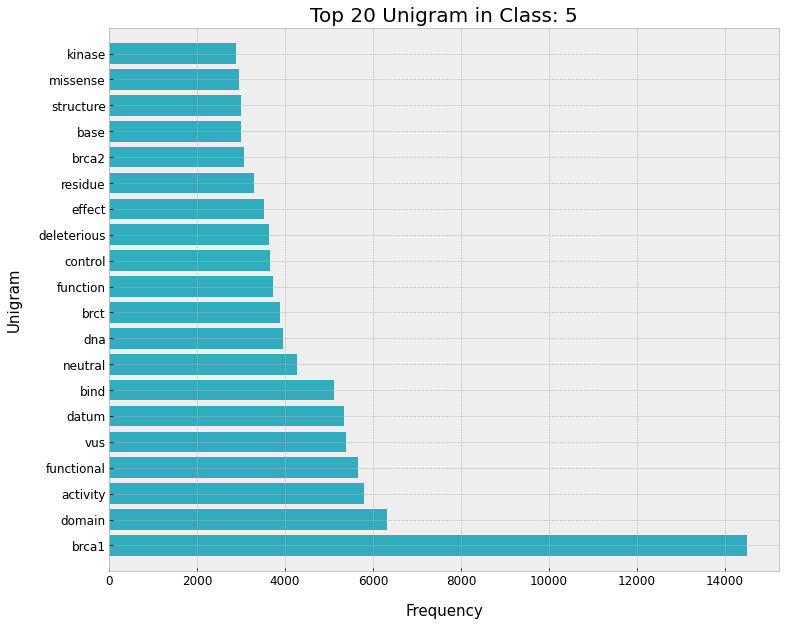

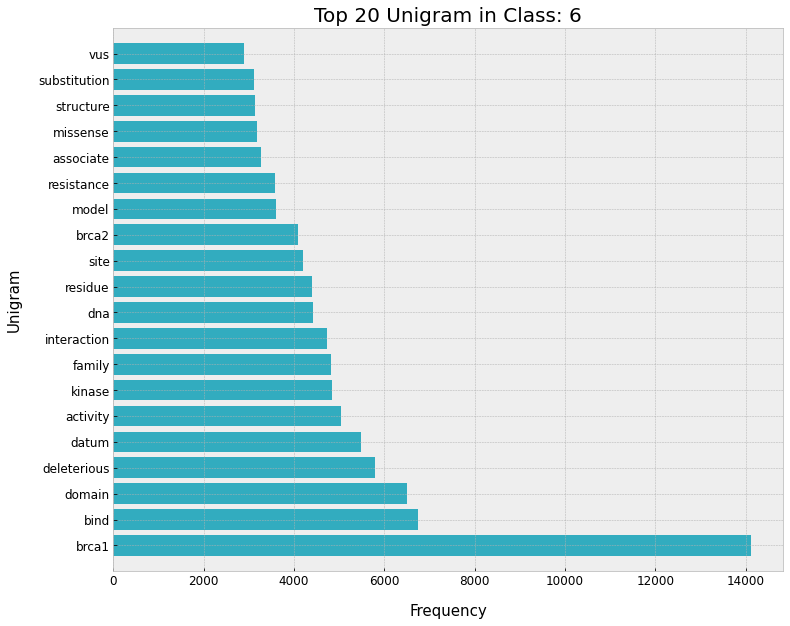

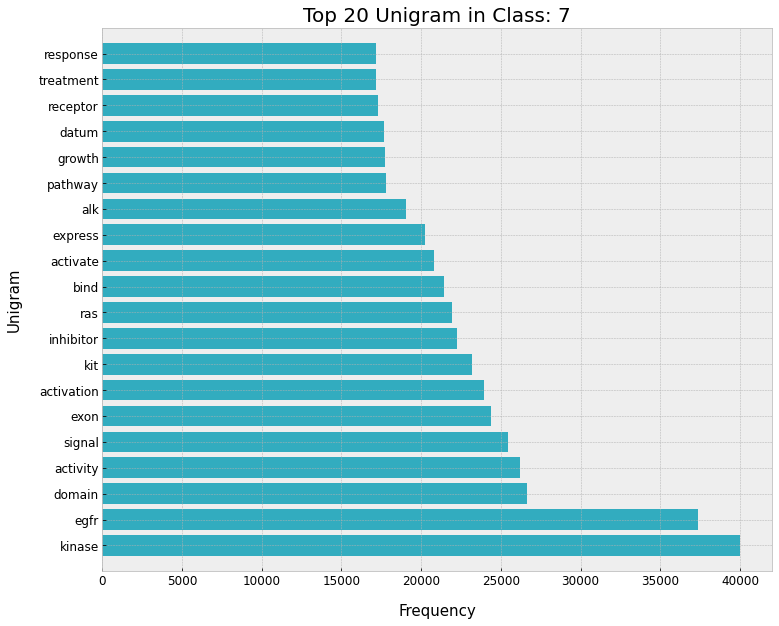

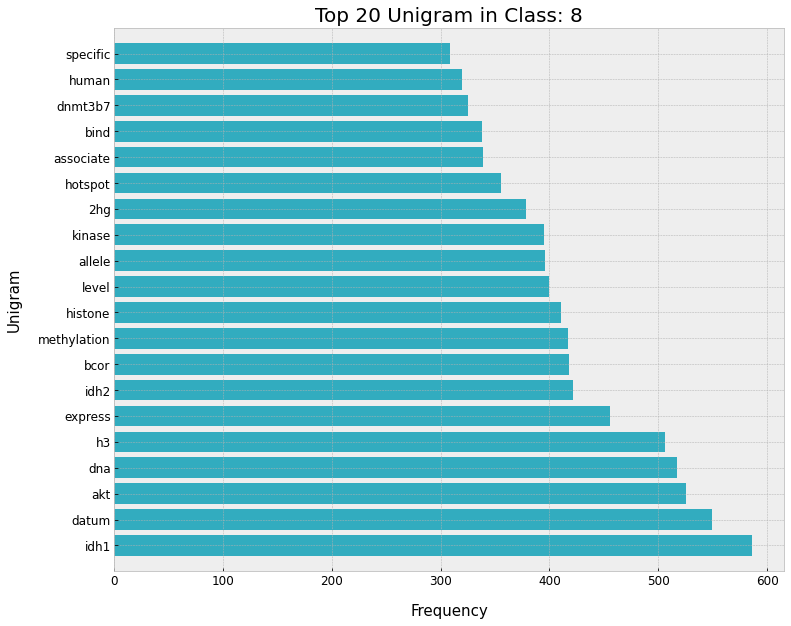

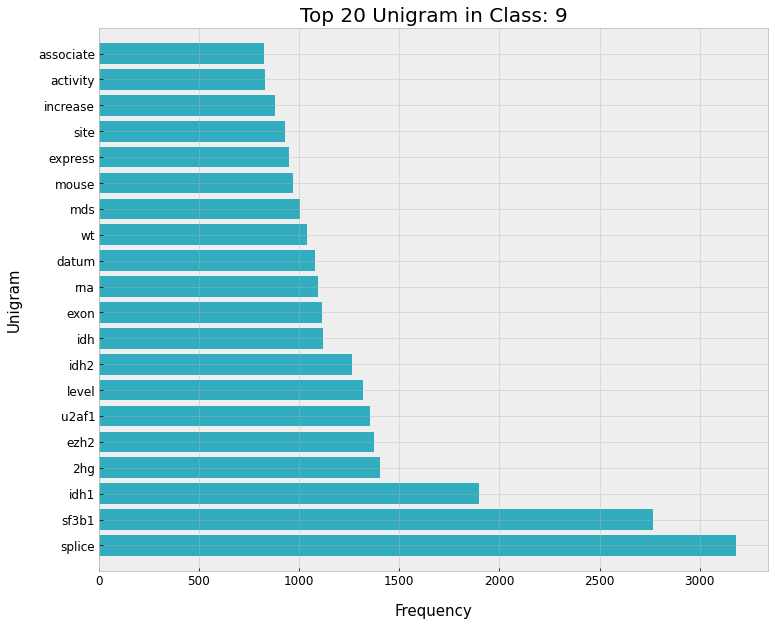

In [4]:
result = pd.read_pickle("/home/zhendi/pm/scripts/result_non_split_strict.pkl")
vec = CountVectorizer(ngram_range=(1, 1)).fit(result["TEXT"])


def get_top_n_words(x, model, n):
    vec = model
    bow = vec.transform(x)
    sum_words = bow.sum(axis=0)
    vec.vocabulary_.items()  # give a dictionary
    words_freq = [
        (word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()
    ]  # a list
    words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)  # a sorted list
    return words_freq[:n]  # select numbers


dict_unigram = {}
for i in range(9):
    class_n = i + 1
    textdata = result[result["Class"] == class_n]["TEXT"]
    dict_unigram[class_n] = get_top_n_words(textdata, vec, 20)

df_list = [
    pd.DataFrame(dict_unigram[i + 1], columns=["Unigram", "Frequency"])
    for i in range(9)
]


def plot_classfeats_h(dfs):
    x = np.arange(len(dfs[0]))  # y axis ticks
    for i, df in enumerate(dfs):
        fig = plt.figure(figsize=(12, 10))
        plt.xlabel("Frequency", labelpad=16, fontsize=15)
        plt.ylabel("Unigram", labelpad=16, fontsize=15)
        plt.title("Top 20 Unigram in Class: " + str(i + 1), fontsize=20)
        plt.barh(df.Unigram, df.Frequency, align="center", color="#32acbf")
        plt.yticks(x, fontsize=12)
        plt.xticks(fontsize=12)
        plt.ylim([-1, x[-1] + 1])
        save_img(
            fig, Im_dir_path, "TextFeature_Count_uni_strict_Class" + str(i + 1) + ".png"
        )
        plt.show()


plot_classfeats_h(df_list)


#### Strict for bigrams

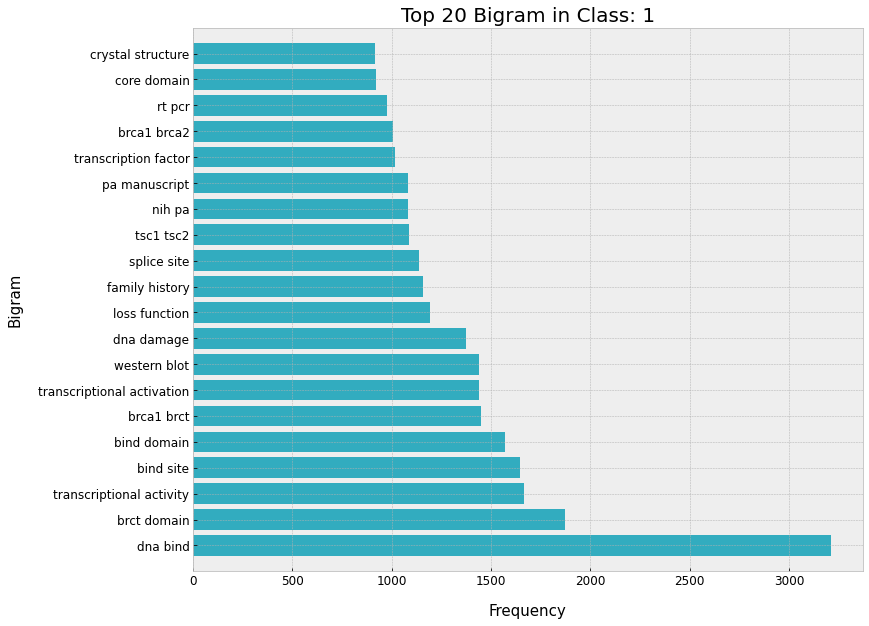

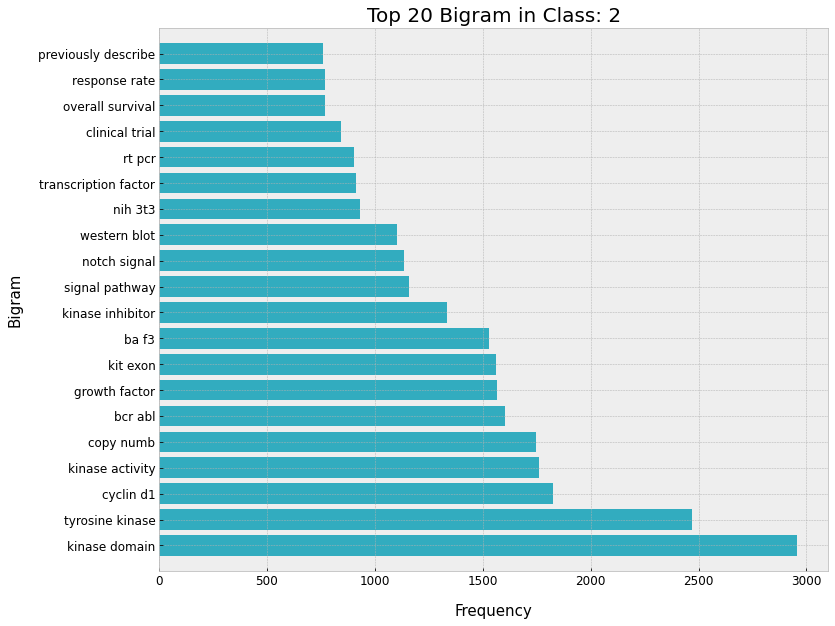

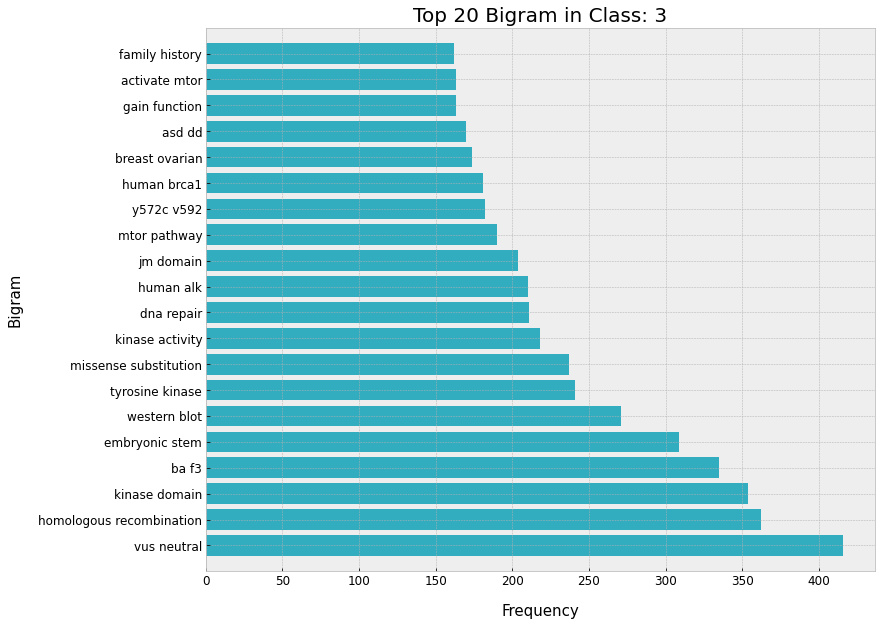

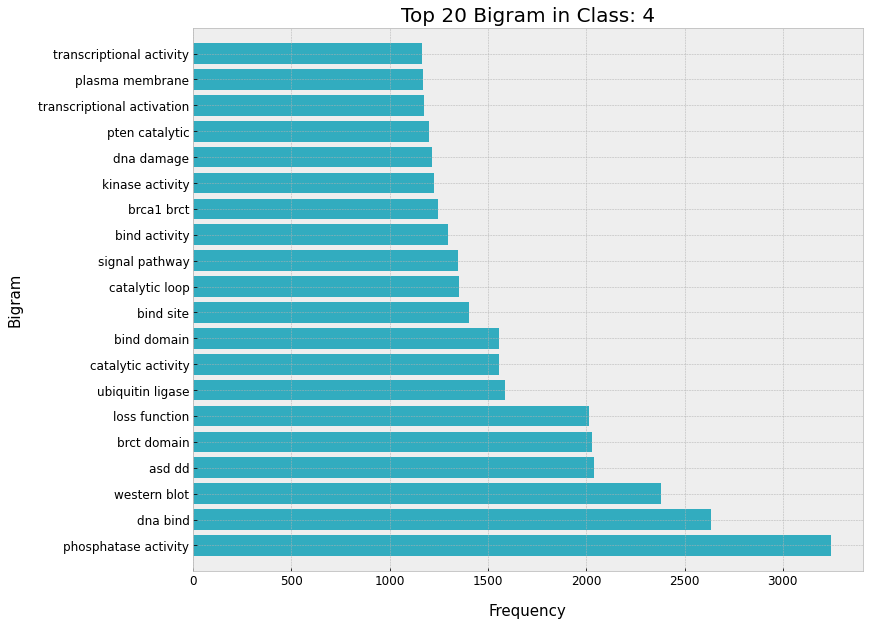

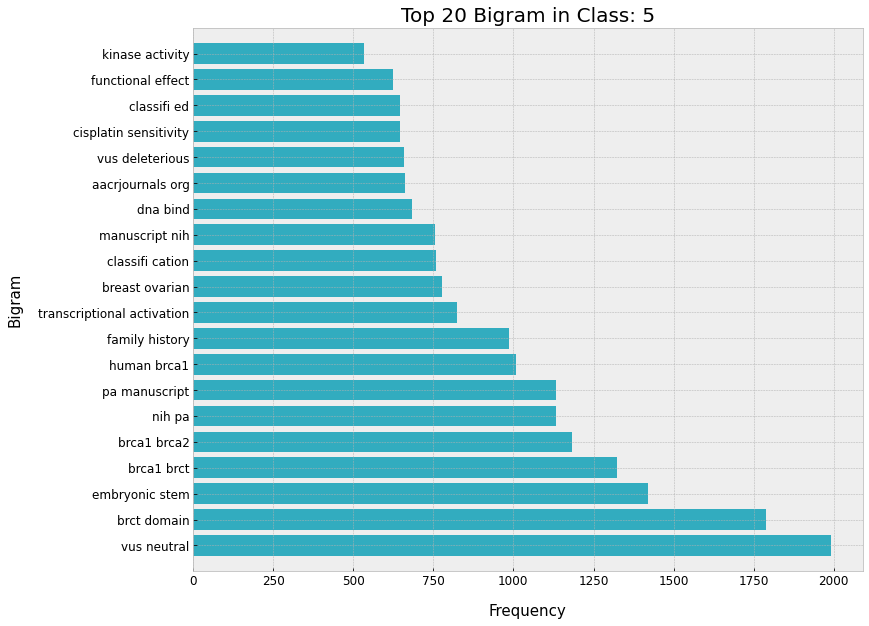

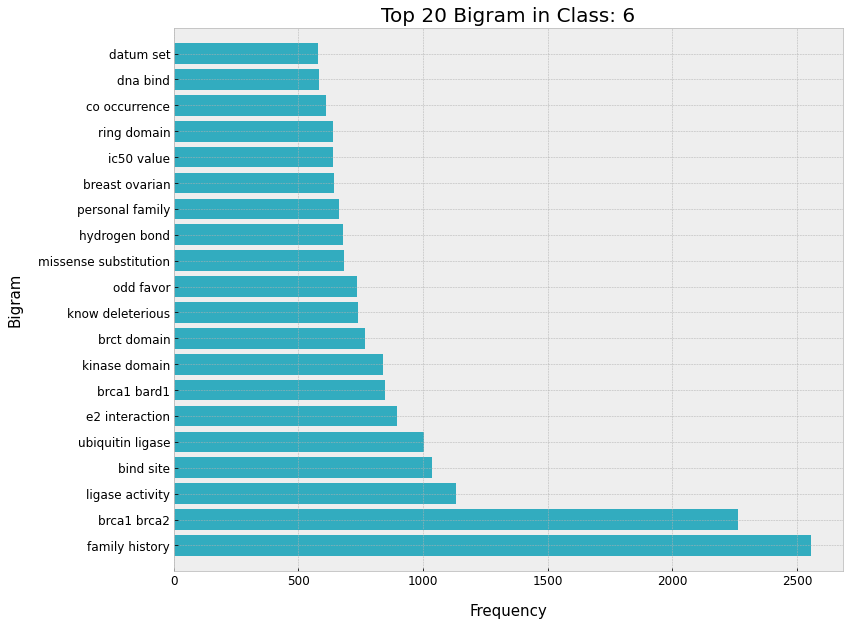

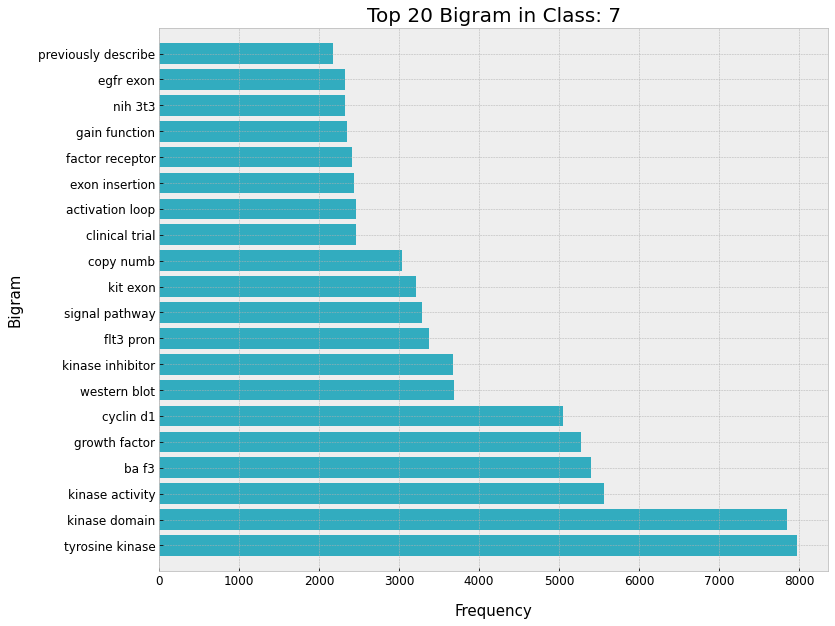

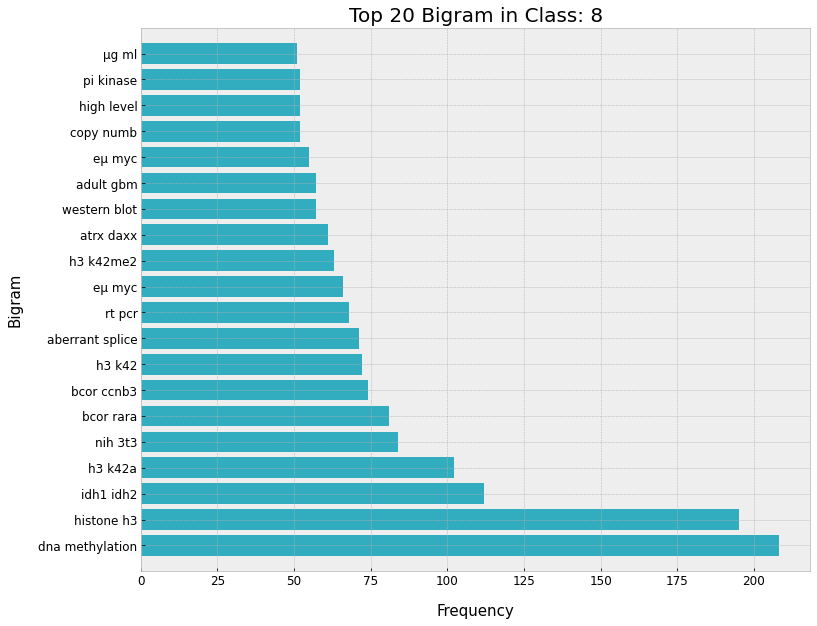

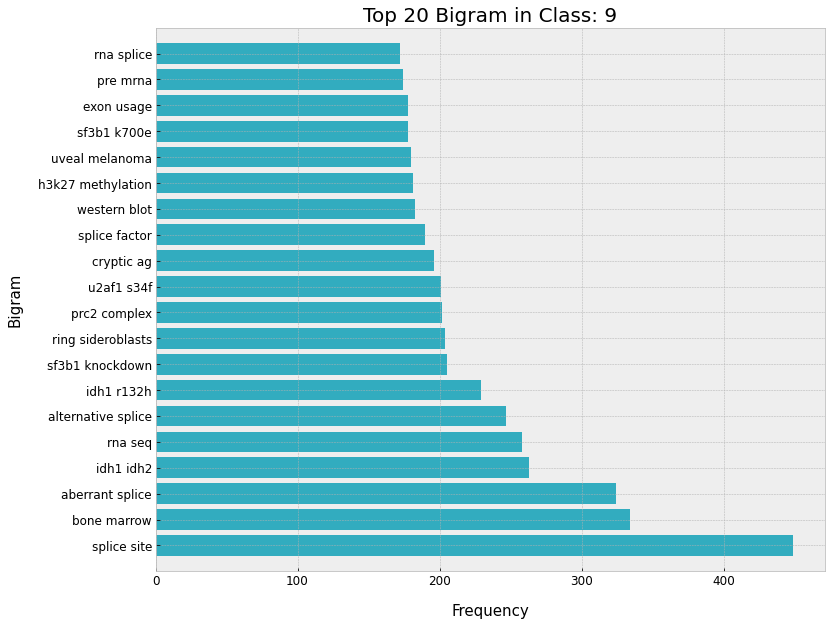

In [5]:
result = pd.read_pickle("/home/zhendi/pm/scripts/result_non_split_strict.pkl")
vec = CountVectorizer(ngram_range=(2, 2)).fit(result["TEXT"])


def get_top_n_words(x, model, n):
    vec = model
    bow = vec.transform(x)
    sum_words = bow.sum(axis=0)
    vec.vocabulary_.items()  # give a dictionary
    words_freq = [
        (word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()
    ]  # a list
    words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)  # a sorted list
    return words_freq[:n]  # select numbers


dict_unigram = {}
for i in range(9):
    class_n = i + 1
    textdata = result[result["Class"] == class_n]["TEXT"]
    dict_unigram[class_n] = get_top_n_words(textdata, vec, 20)

df_list = [
    pd.DataFrame(dict_unigram[i + 1], columns=["Bigram", "Frequency"]) for i in range(9)
]


def plot_classfeats_h(dfs):
    x = np.arange(len(dfs[0]))  # y axis ticks
    for i, df in enumerate(dfs):
        fig = plt.figure(figsize=(12, 10))
        plt.xlabel("Frequency", labelpad=16, fontsize=15)
        plt.ylabel("Bigram", labelpad=16, fontsize=15)
        plt.title("Top 20 Bigram in Class: " + str(i + 1), fontsize=20)
        plt.barh(df.Bigram, df.Frequency, align="center", color="#32acbf")
        plt.yticks(x, fontsize=12)
        plt.xticks(fontsize=12)
        plt.ylim([-1, x[-1] + 1])
        save_img(
            fig, Im_dir_path, "TextFeature_Count_bi_strict_Class" + str(i + 1) + ".png"
        )
        plt.show()


plot_classfeats_h(df_list)



#### Strict for trigrams

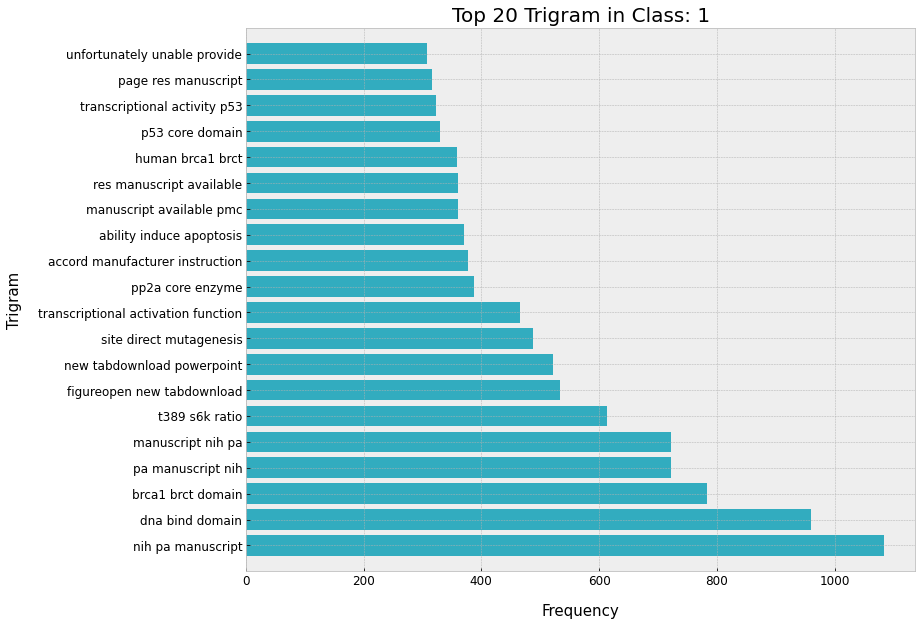

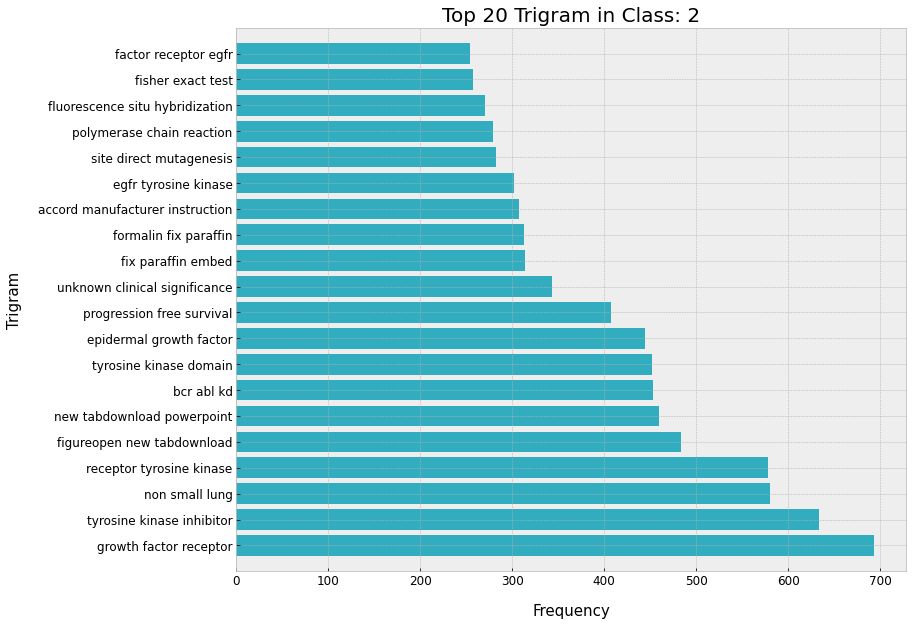

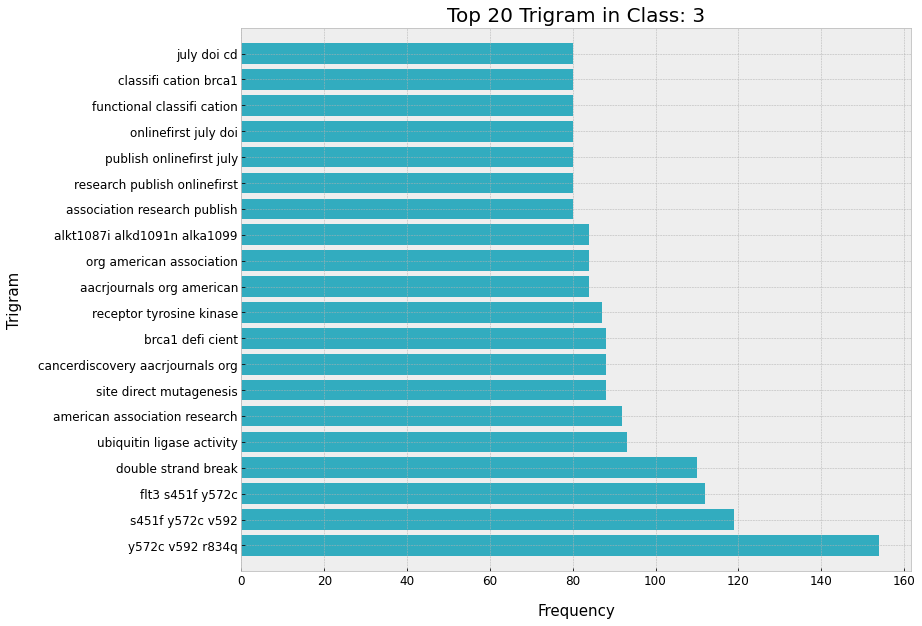

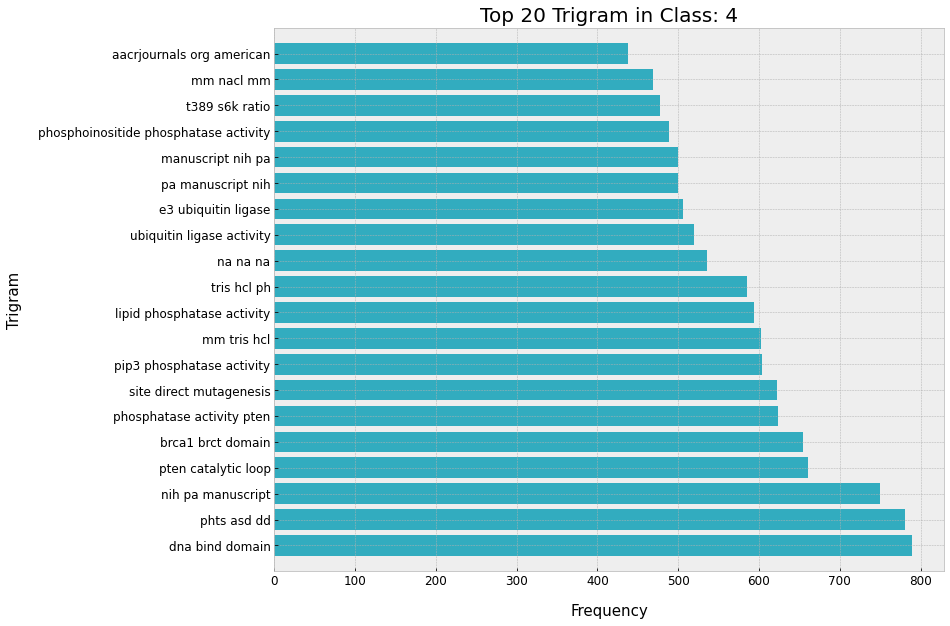

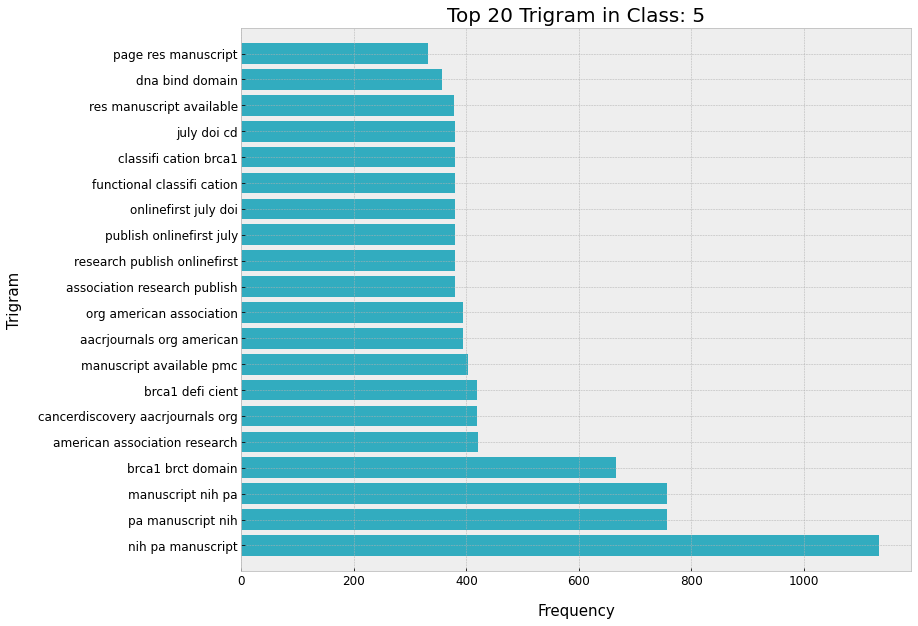

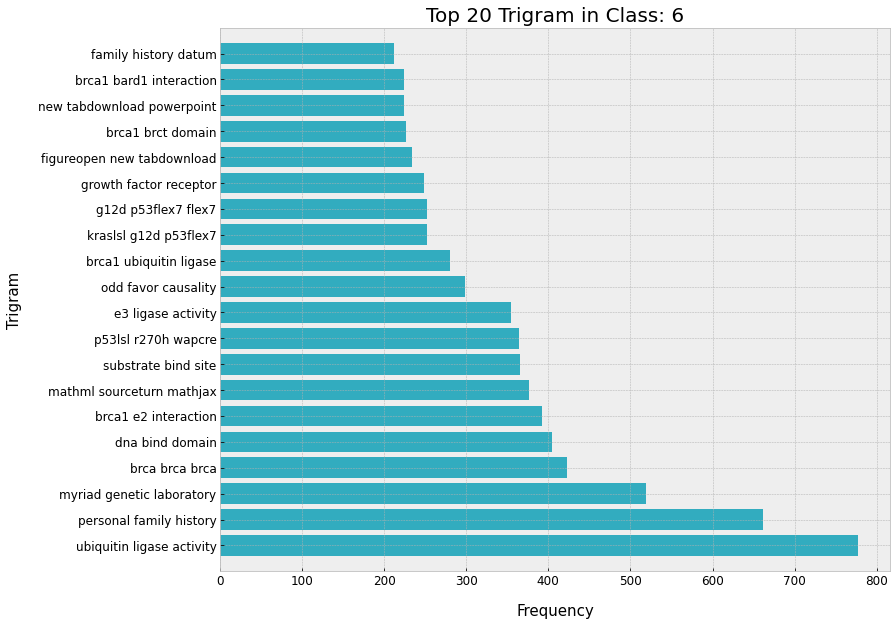

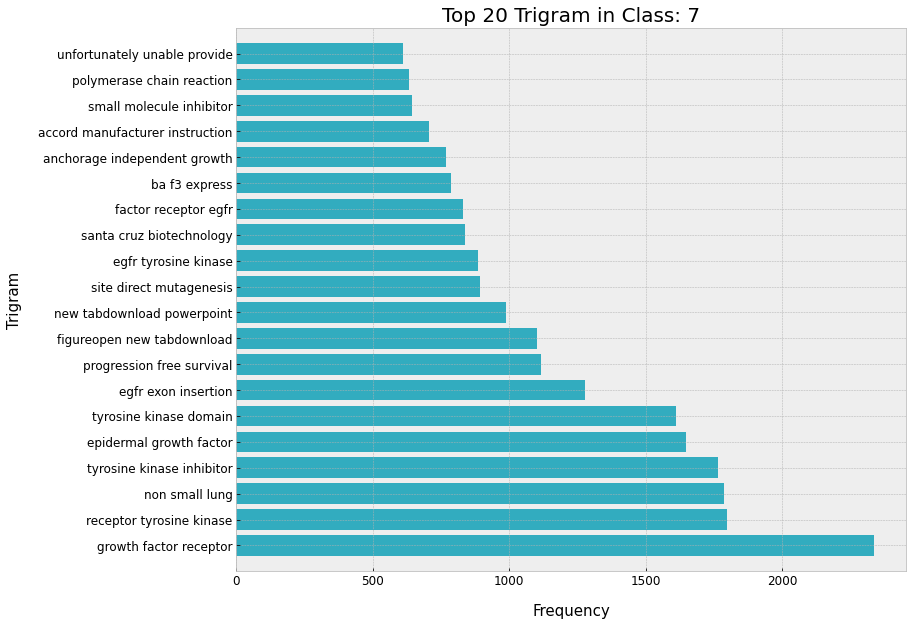

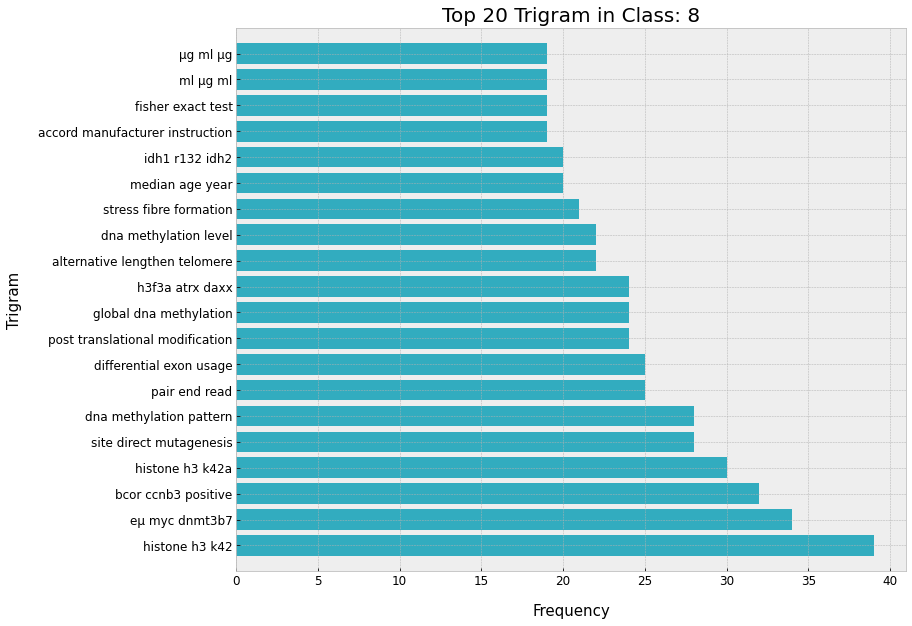

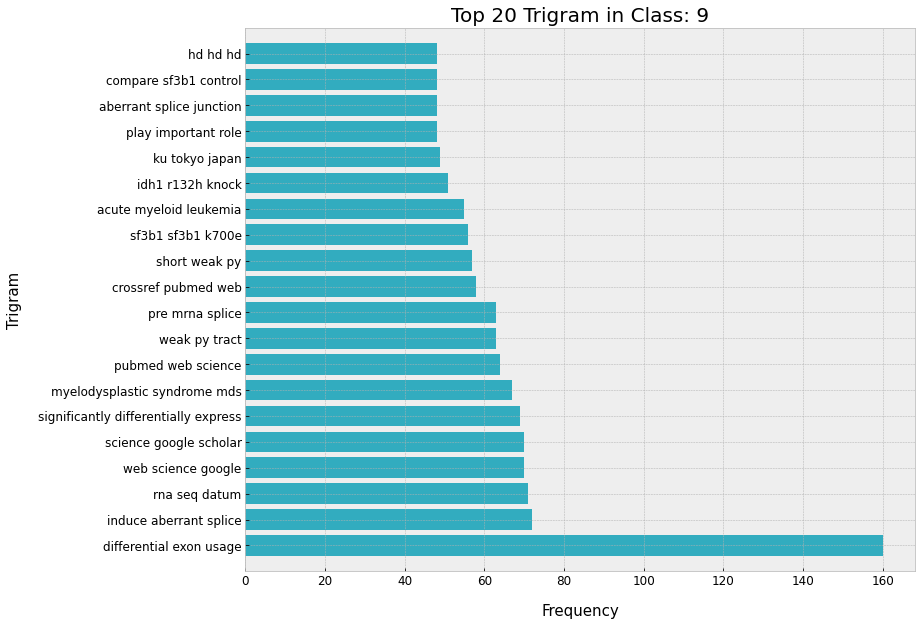

In [6]:
result = pd.read_pickle("/home/zhendi/pm/scripts/result_non_split_strict.pkl")
vec = CountVectorizer(ngram_range=(3, 3)).fit(result["TEXT"])


def get_top_n_words(x, model, n):
    vec = model
    bow = vec.transform(x)
    sum_words = bow.sum(axis=0)
    vec.vocabulary_.items()  # give a dictionary
    words_freq = [
        (word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()
    ]  # a list
    words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)  # a sorted list
    return words_freq[:n]  # select numbers


dict_unigram = {}
for i in range(9):
    class_n = i + 1
    textdata = result[result["Class"] == class_n]["TEXT"]
    dict_unigram[class_n] = get_top_n_words(textdata, vec, 20)
df_list = [
    pd.DataFrame(dict_unigram[i + 1], columns=["Trigram", "Frequency"])
    for i in range(9)
]


def plot_classfeats_h(dfs):
    x = np.arange(len(dfs[0]))  # y axis ticks
    for i, df in enumerate(dfs):
        fig = plt.figure(figsize=(12, 10))
        plt.xlabel("Frequency", labelpad=16, fontsize=15)
        plt.ylabel("Trigram", labelpad=16, fontsize=15)
        plt.title("Top 20 Trigram in Class: " + str(i + 1), fontsize=20)
        plt.barh(df.Trigram, df.Frequency, align="center", color="#32acbf")
        plt.yticks(x, fontsize=12)
        plt.xticks(fontsize=12)
        plt.ylim([-1, x[-1] + 1])
        save_img(
            fig, Im_dir_path, "TextFeature_Count_tri_strict_Class" + str(i + 1) + ".png"
        )
        plt.show()


plot_classfeats_h(df_list)
